<a href="https://colab.research.google.com/github/AndrewBoessen/CSCI3387_Notebooks/blob/main/TrainVQVAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# _Dependencies_

In [ ]:
!pip install umap-learn
!pip install gymnasium
!pip install "gymnasium[atari, accept-rom-license]"

# _Imports_

In [ ]:
from __future__ import print_function

%matplotlib inline
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split
import torch.optim as optim

import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid

import numpy as np
from six.moves import xrange
import umap.umap_ as umap
from collections import deque
import random

import gymnasium as gym
from gymnasium.wrappers import RecordVideo
from IPython import display
from IPython.display import HTML
from base64 import b64encode

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import numpy
import numpy as np

# Specify the path to your .npy file in Google Drive
file_path = '/content/drive/My Drive/CSCI3387 Project/skiing_observations (1).npy'

# Load the numpy file
data = np.load(file_path)

data = data.astype(np.float32)

# Print the loaded data
print(data.shape)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
(1010, 256, 256, 3)


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
# Assuming your data is in the shape (n_samples, ...)
training_data, validation_data = train_test_split(data, test_size=0.2, random_state=42)

# Print the shapes of the resulting datasets
print("Training data shape:", training_data.shape)
print("Validation data shape:", validation_data.shape)


Training data shape: (808, 256, 256, 3)
Validation data shape: (202, 256, 256, 3)


In [ ]:
data_variance = np.var(training_data / 255.0)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# __VQ-VAE Implementation__

The pytorch implementation for the VQ-VAE network is given below

In [ ]:
class VectorQuantizerEMA(nn.Module):
    '''
    Implements Exponential Moving Average (EMA) vector quantization for VQ-VAE models.
    '''
    def __init__(self, num_embeddings, embedding_dim, commitment_cost, decay, epsilon=1e-5):
        super(VectorQuantizerEMA, self).__init__()

        self._embedding_dim = embedding_dim # Dimension of the embedding, D
        self._num_embeddings = num_embeddings # Number of categories in distribution, K

        self._embedding = nn.Embedding(self._num_embeddings, self._embedding_dim) # Embedding table
        self._embedding.weight.data.normal_()
        self._commitment_cost = commitment_cost # Constant used in loss function

        self.register_buffer('_ema_cluster_size', torch.zeros(num_embeddings))
        self._ema_w = nn.Parameter(torch.Tensor(num_embeddings, self._embedding_dim))
        self._ema_w.data.normal_()

        self._decay = decay
        self._epsilon = epsilon

    def forward(self, inputs):
        # convert inputs from BCHW -> BHWC
        inputs = inputs.permute(0, 2, 3, 1).contiguous()
        input_shape = inputs.shape

        # Flatten input
        flat_input = inputs.view(-1, self._embedding_dim)

        # Calculate distances
        distances = (torch.sum(flat_input**2, dim=1, keepdim=True)
                    + torch.sum(self._embedding.weight**2, dim=1)
                    - 2 * torch.matmul(flat_input, self._embedding.weight.t()))

        # Encoding
        encoding_indices = torch.argmin(distances, dim=1).unsqueeze(1)
        encodings = torch.zeros(encoding_indices.shape[0], self._num_embeddings, device=inputs.device)
        encodings.scatter_(1, encoding_indices, 1)

        # Quantize and unflatten
        quantized = torch.matmul(encodings, self._embedding.weight).view(input_shape)

        # Use EMA to update the embedding vectors
        if self.training:
            self._ema_cluster_size = self._ema_cluster_size * self._decay + \
                                     (1 - self._decay) * torch.sum(encodings, 0)

            # Laplace smoothing of the cluster size
            n = torch.sum(self._ema_cluster_size.data)
            self._ema_cluster_size = (
                (self._ema_cluster_size + self._epsilon)
                / (n + self._num_embeddings * self._epsilon) * n)

            dw = torch.matmul(encodings.t(), flat_input)
            self._ema_w = nn.Parameter(self._ema_w * self._decay + (1 - self._decay) * dw)

            self._embedding.weight = nn.Parameter(self._ema_w / self._ema_cluster_size.unsqueeze(1))

        # Loss
        e_latent_loss = F.mse_loss(quantized.detach(), inputs)
        loss = self._commitment_cost * e_latent_loss

        # Straight Through Estimator
        quantized = inputs + (quantized - inputs).detach()
        avg_probs = torch.mean(encodings, dim=0)
        perplexity = torch.exp(-torch.sum(avg_probs * torch.log(avg_probs + 1e-10)))

        # convert quantized from BHWC -> BCHW
        return loss, quantized.permute(0, 3, 1, 2).contiguous(), perplexity, encodings

In [ ]:
class Residual(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_hiddens):
        super(Residual, self).__init__()
        self._block = nn.Sequential(
            nn.ReLU(True),
            nn.Conv2d(in_channels=in_channels,
                      out_channels=num_residual_hiddens,
                      kernel_size=3, stride=1, padding=1, bias=False),
            nn.ReLU(True),
            nn.Conv2d(in_channels=num_residual_hiddens,
                      out_channels=num_hiddens,
                      kernel_size=1, stride=1, bias=False)
        )

    def forward(self, x):
        return x + self._block(x)


class ResidualStack(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(ResidualStack, self).__init__()
        self._num_residual_layers = num_residual_layers
        self._layers = nn.ModuleList([Residual(in_channels, num_hiddens, num_residual_hiddens)
                             for _ in range(self._num_residual_layers)])

    def forward(self, x):
        for i in range(self._num_residual_layers):
            x = self._layers[i](x)
        return F.relu(x)

In [ ]:
class Encoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(Encoder, self).__init__()

        self._conv1 = nn.Conv2d(in_channels=in_channels, out_channels=num_hiddens//2,
                                 kernel_size=4,
                                 stride=2, padding=1)

        self._conv2 = nn.Conv2d(in_channels=num_hiddens//2, out_channels=num_hiddens,
                                 kernel_size=4,
                                 stride=2, padding=1)

        self._conv3 = nn.Conv2d(in_channels=num_hiddens, out_channels=num_hiddens,
                                 kernel_size=3,
                                 stride=1, padding=1)

        self._residual_stack = ResidualStack(in_channels=num_hiddens,
                                             num_hiddens=num_hiddens,
                                             num_residual_layers=num_residual_layers,
                                             num_residual_hiddens=num_residual_hiddens)

    def forward(self, inputs):
        x = self._conv1(inputs)
        x = F.relu(x)
        x = self._conv2(x)
        x = F.relu(x)
        x = self._conv3(x)
        return self._residual_stack(x)

In [ ]:
class Decoder(nn.Module):
    def __init__(self, in_channels, num_hiddens, num_residual_layers, num_residual_hiddens):
        super(Decoder, self).__init__()

        self._conv1 = nn.Conv2d(in_channels=in_channels, out_channels=num_hiddens,
                                kernel_size=3, stride=1, padding=1)
        self._residual_stack = ResidualStack(in_channels=num_hiddens, num_hiddens=num_hiddens,
                                             num_residual_layers=num_residual_layers,
                                             num_residual_hiddens=num_residual_hiddens)
        self._conv_trans_1 = nn.ConvTranspose2d(in_channels=num_hiddens,
                                                out_channels=num_hiddens // 2,
                                                kernel_size=4, stride=2, padding=1)
        self._conv_trans_2 = nn.ConvTranspose2d(in_channels=num_hiddens // 2,
                                                out_channels=3,
                                                kernel_size=4, stride=2, padding=1)

    def forward(self, inputs):
        x = self._conv1(inputs)
        x = self._residual_stack(x)
        x = self._conv_trans_1(x)
        x = F.relu(x)
        return self._conv_trans_2(x)

In [ ]:
class VQVAE(nn.Module):
    def __init__(self, num_hiddens, num_residual_layers, num_residual_hiddens,
                 num_embeddings, embedding_dim, commitment_cost, decay):
        super(VQVAE, self).__init__()

        self._encoder = Encoder(3, num_hiddens, num_residual_layers, num_residual_hiddens)
        self._pre_vq_conv = nn.Conv2d(in_channels=num_hiddens, out_channels=embedding_dim,
                                      kernel_size=1, stride=1)

        self._vq = VectorQuantizerEMA(num_embeddings, embedding_dim, commitment_cost, decay)
        self._decoder = Decoder(embedding_dim, num_hiddens, num_residual_layers, num_residual_hiddens)

    def forward(self, x):
        z = self._encoder(x) # encode image to latent
        z = self._pre_vq_conv(z)
        loss, quantized, perplexity, _ = self._vq(z) # quantize encoding to dicrete space
        x_recon = self._decoder(quantized) # reconstruction of input from decoder
        return loss, x_recon, perplexity

# __Train__

We use the hyperparameters from the author's code:

In [ ]:
batch_size = 32
num_training_updates = 15000

num_hiddens = 128
num_residual_hiddens = 32
num_residual_layers = 2

embedding_dim = 64
num_embeddings = 512

commitment_cost = 0.25

decay = 0.99

learning_rate = 1e-4

In [ ]:
training_loader = DataLoader(training_data,
                             batch_size=batch_size,
                             shuffle=True,
                             pin_memory=True)

In [ ]:
validation_loader = DataLoader(validation_data,
                               batch_size=32,
                               shuffle=True,
                               pin_memory=True)

In [ ]:
model = VQVAE(num_hiddens, num_residual_layers, num_residual_hiddens,
              num_embeddings, embedding_dim,
              commitment_cost, decay).to(device)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

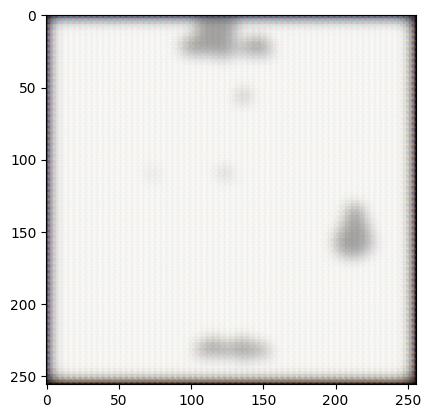

100 iterations
recon_error: 1729840.861
perplexity: 1.251



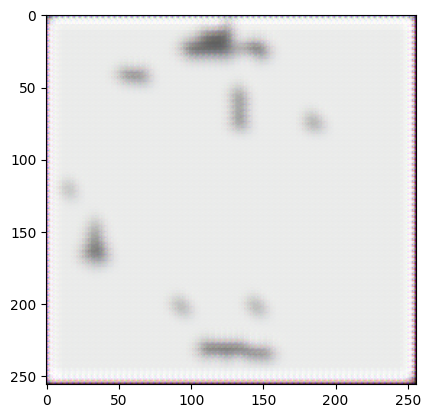

200 iterations
recon_error: 127312.613
perplexity: 1.326



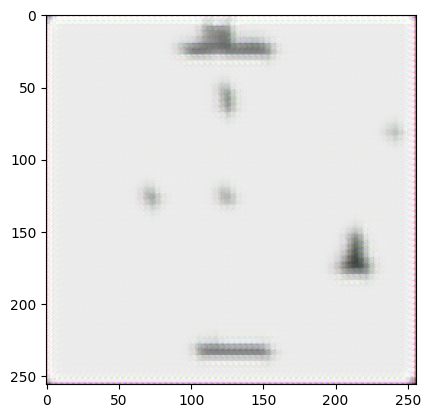

300 iterations
recon_error: 57118.536
perplexity: 1.326



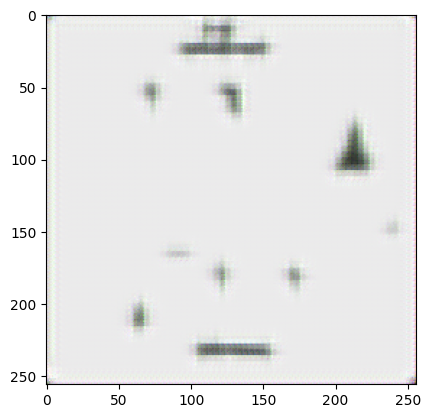

400 iterations
recon_error: 34080.593
perplexity: 1.341



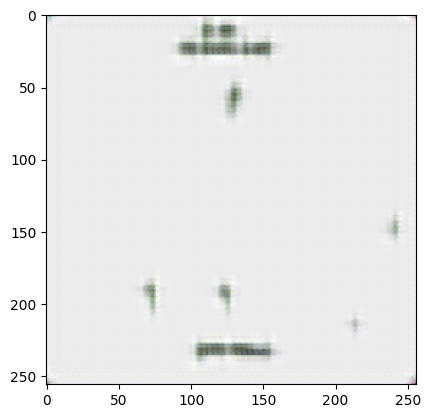

500 iterations
recon_error: 26210.448
perplexity: 1.401



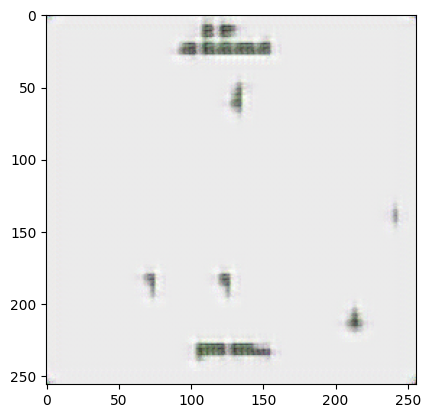

600 iterations
recon_error: 22578.909
perplexity: 1.372



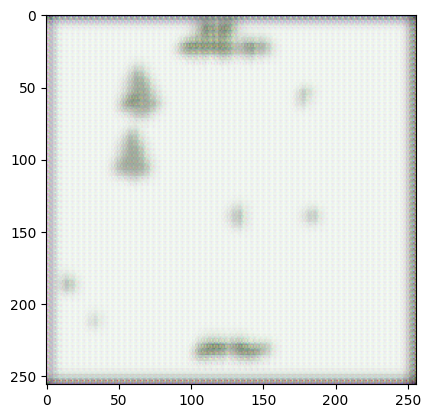

700 iterations
recon_error: 373994.481
perplexity: 1.451



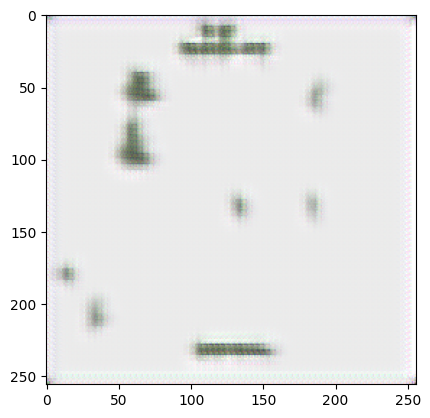

800 iterations
recon_error: 43483.765
perplexity: 1.558



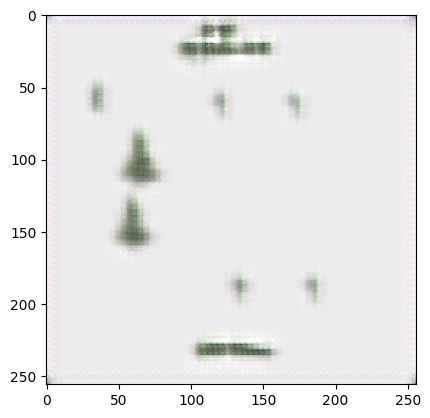

900 iterations
recon_error: 36308.636
perplexity: 1.588



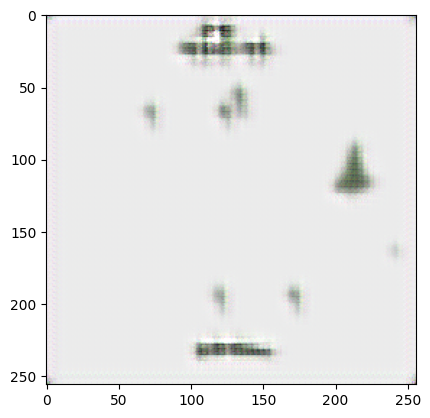

1000 iterations
recon_error: 26074.334
perplexity: 1.552



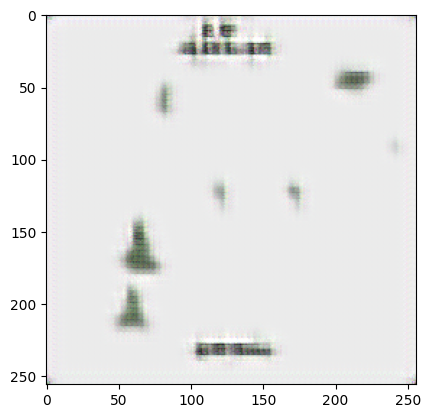

1100 iterations
recon_error: 24498.418
perplexity: 1.560



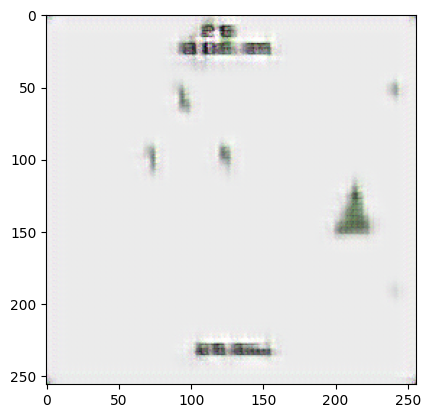

1200 iterations
recon_error: 23472.406
perplexity: 1.697



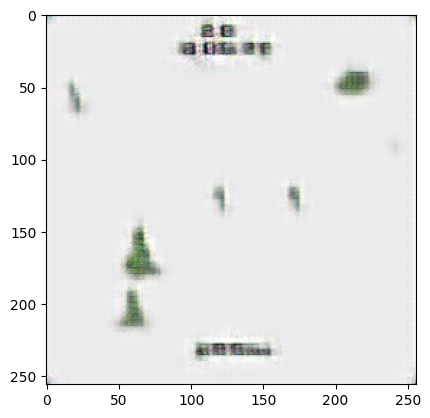

1300 iterations
recon_error: 22029.523
perplexity: 1.784



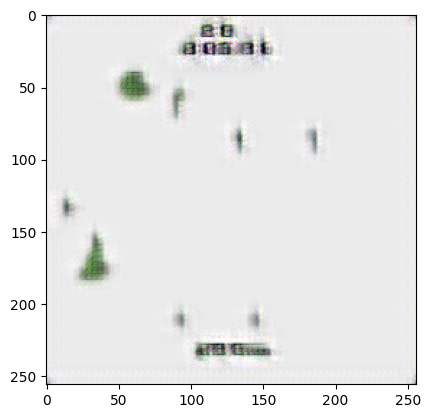

1400 iterations
recon_error: 20532.644
perplexity: 1.980



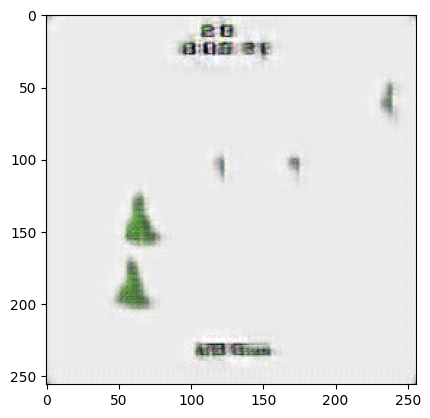

1500 iterations
recon_error: 19431.407
perplexity: 2.096



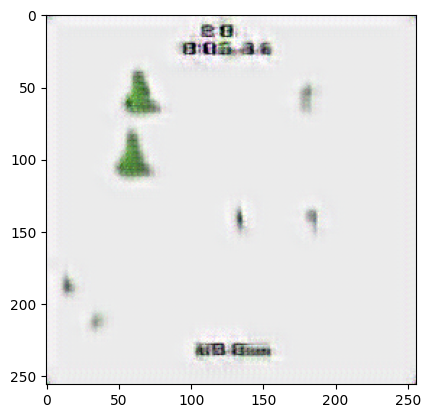

1600 iterations
recon_error: 18323.519
perplexity: 2.162



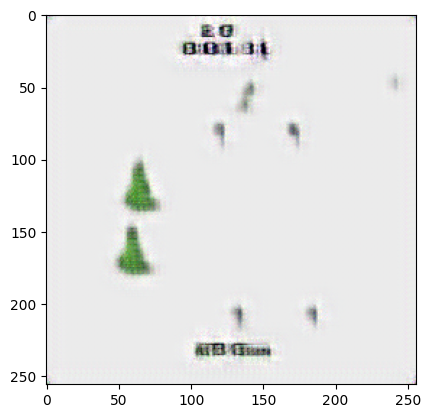

1700 iterations
recon_error: 16879.010
perplexity: 2.172



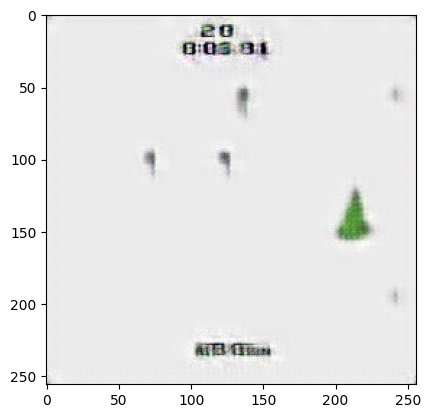

1800 iterations
recon_error: 15869.958
perplexity: 2.184



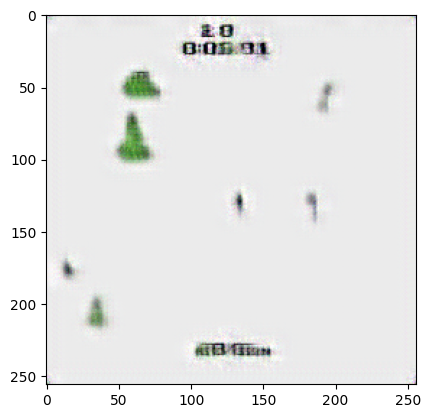

1900 iterations
recon_error: 14922.730
perplexity: 2.209



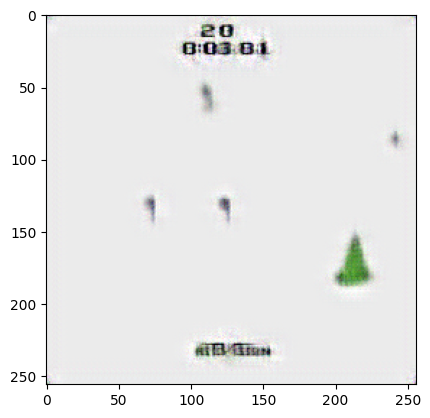

2000 iterations
recon_error: 14131.436
perplexity: 2.224



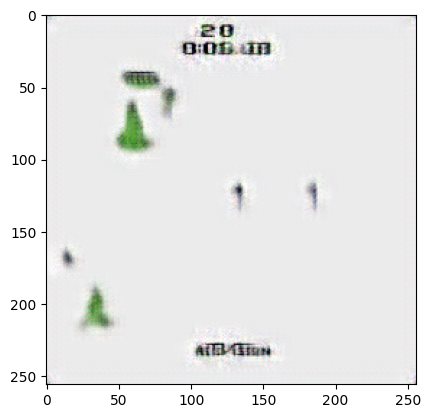

2100 iterations
recon_error: 13685.770
perplexity: 2.237



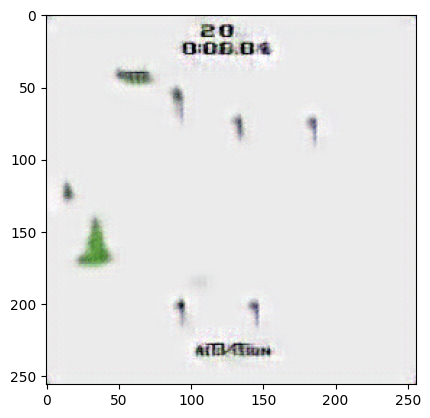

2200 iterations
recon_error: 12982.279
perplexity: 2.248



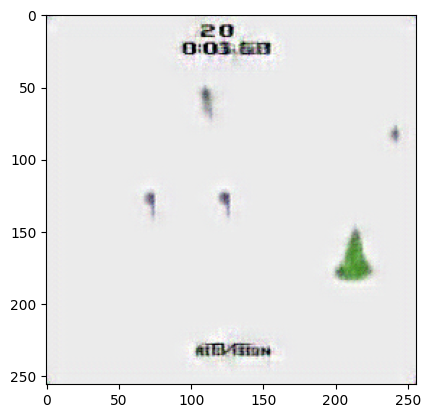

2300 iterations
recon_error: 12270.019
perplexity: 2.298



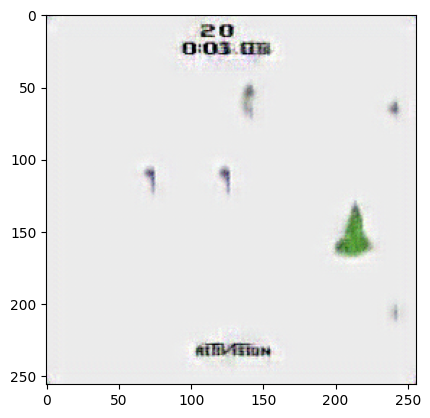

2400 iterations
recon_error: 11793.118
perplexity: 2.303



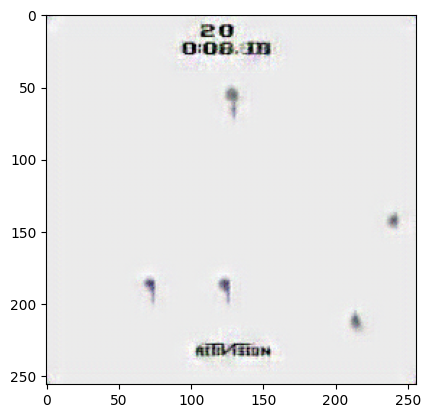

2500 iterations
recon_error: 11409.666
perplexity: 2.318



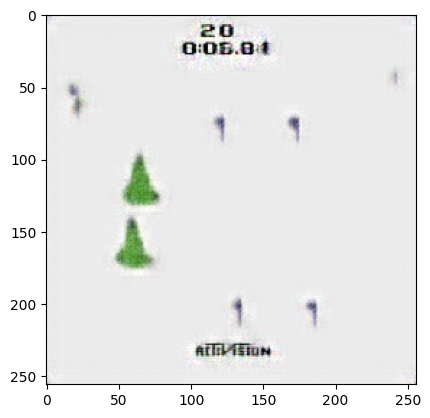

2600 iterations
recon_error: 11021.807
perplexity: 2.319



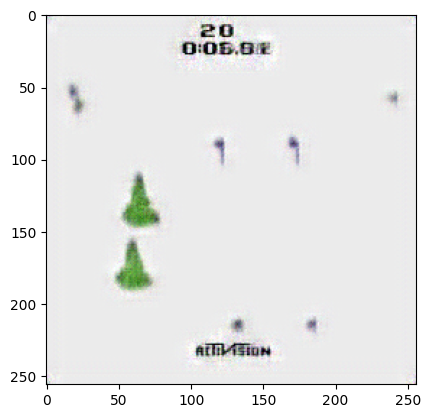

2700 iterations
recon_error: 10675.695
perplexity: 2.334



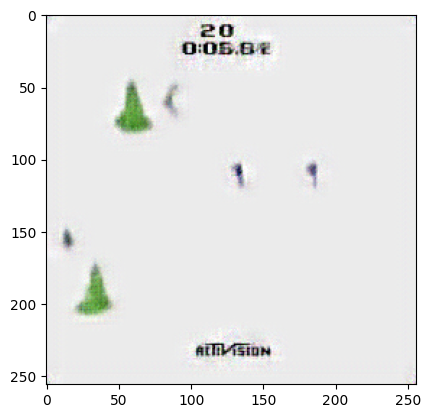

2800 iterations
recon_error: 10194.255
perplexity: 2.353



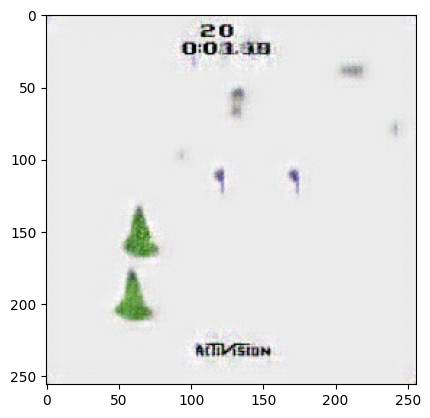

2900 iterations
recon_error: 9732.257
perplexity: 2.371



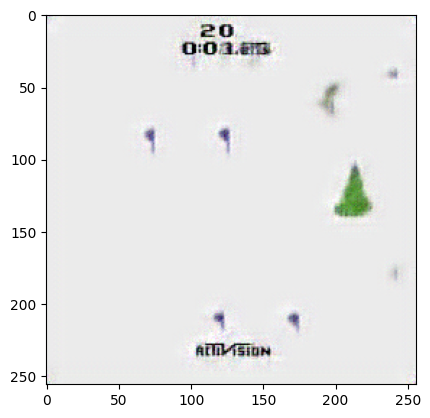

3000 iterations
recon_error: 9633.808
perplexity: 2.365



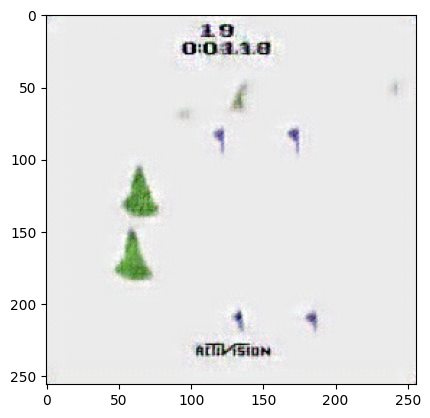

3100 iterations
recon_error: 9399.002
perplexity: 2.354



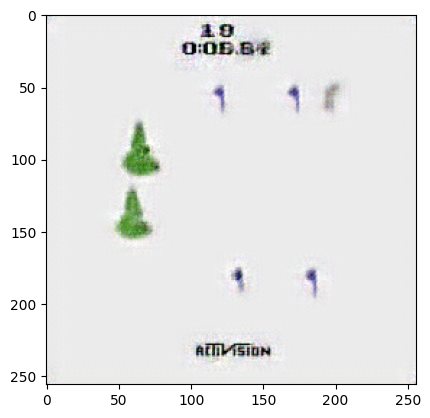

3200 iterations
recon_error: 9046.449
perplexity: 2.341



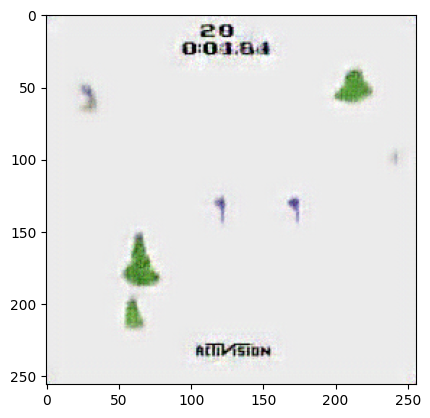

3300 iterations
recon_error: 8791.695
perplexity: 2.333



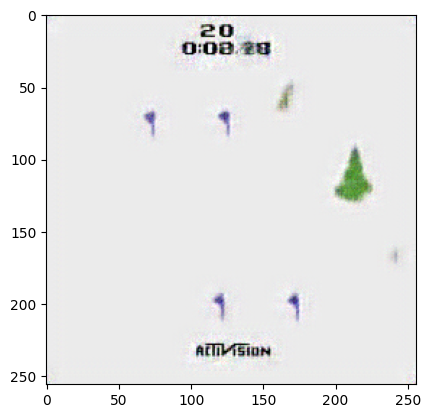

3400 iterations
recon_error: 8434.470
perplexity: 2.328



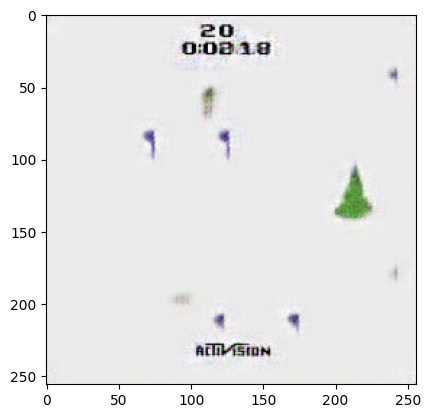

3500 iterations
recon_error: 8163.596
perplexity: 2.331



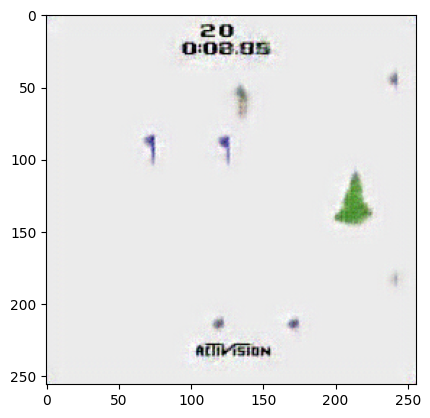

3600 iterations
recon_error: 7900.205
perplexity: 2.328



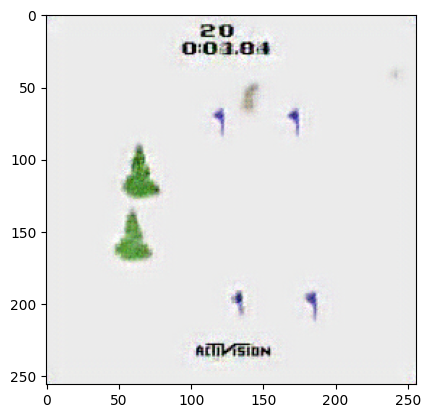

3700 iterations
recon_error: 7641.261
perplexity: 2.330



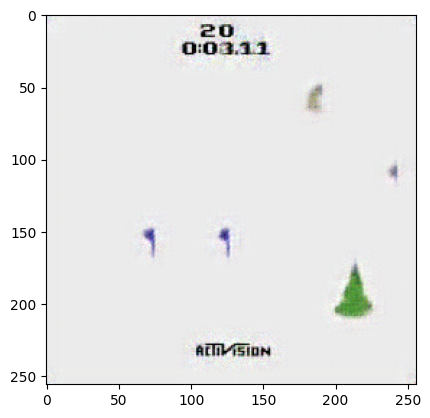

3800 iterations
recon_error: 7324.889
perplexity: 2.334



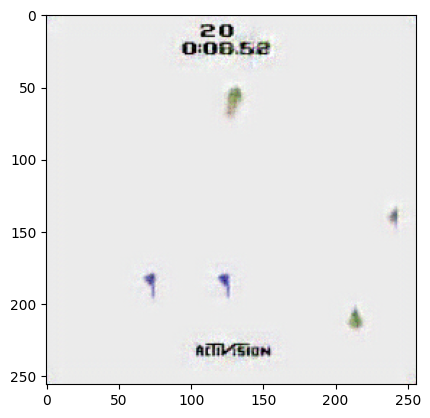

3900 iterations
recon_error: 7229.051
perplexity: 2.344



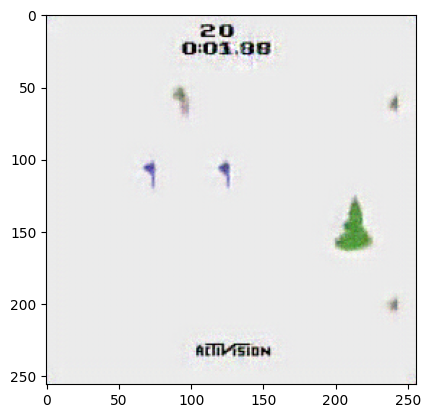

4000 iterations
recon_error: 6979.460
perplexity: 2.344



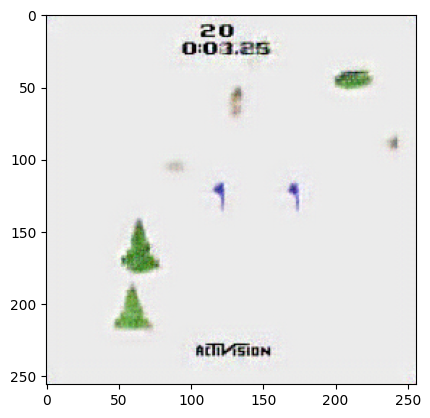

4100 iterations
recon_error: 6711.089
perplexity: 2.338



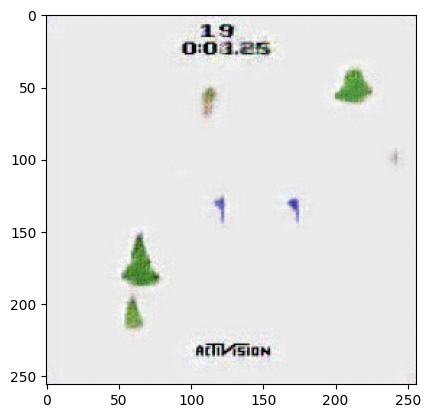

4200 iterations
recon_error: 6549.574
perplexity: 2.342



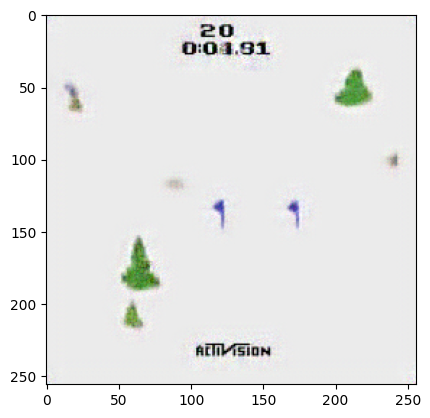

4300 iterations
recon_error: 6338.407
perplexity: 2.346



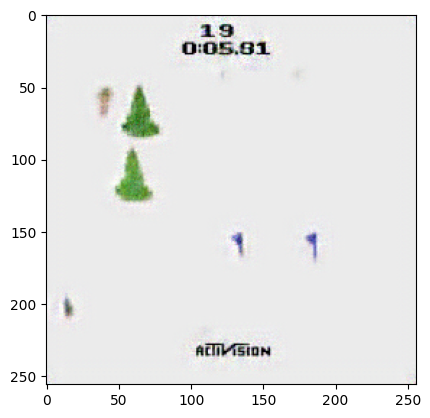

4400 iterations
recon_error: 6167.034
perplexity: 2.383



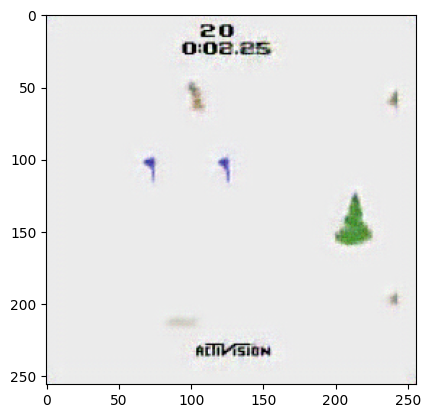

4500 iterations
recon_error: 5929.818
perplexity: 2.392



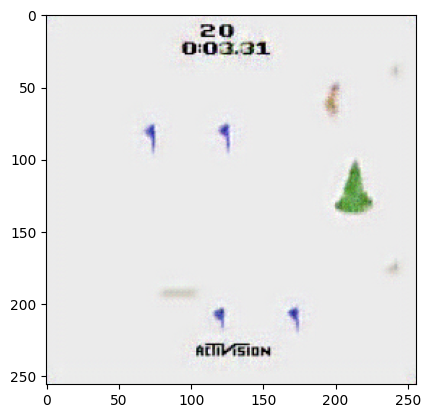

4600 iterations
recon_error: 5799.050
perplexity: 2.394



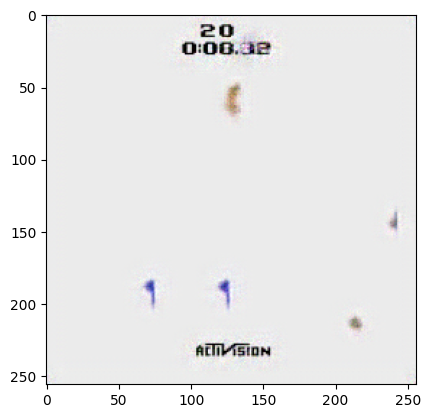

4700 iterations
recon_error: 5687.191
perplexity: 2.399



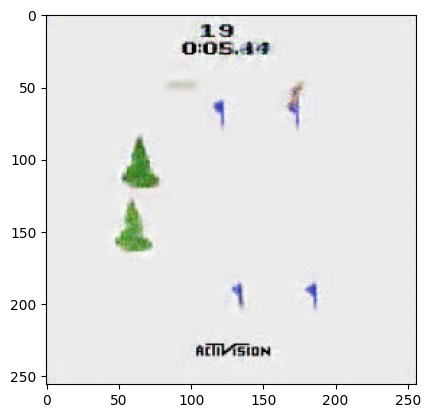

4800 iterations
recon_error: 5564.150
perplexity: 2.396



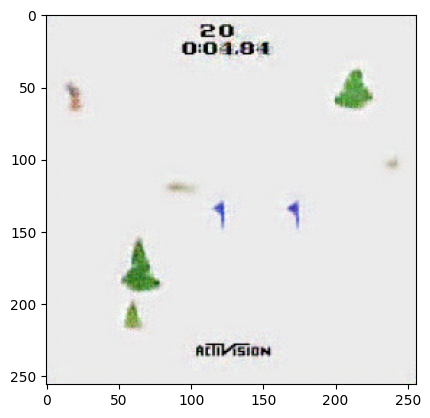

4900 iterations
recon_error: 5418.287
perplexity: 2.394



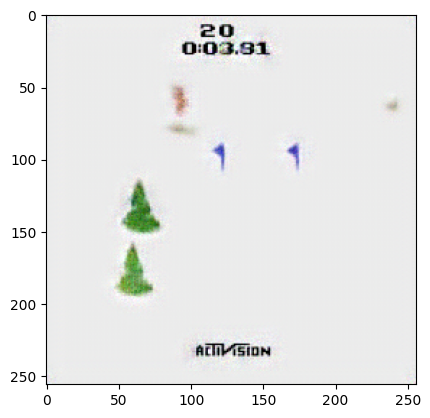

5000 iterations
recon_error: 5304.981
perplexity: 2.393



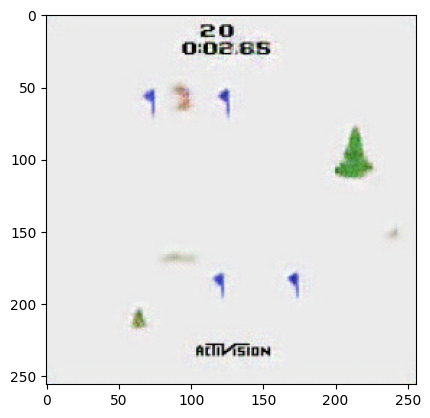

5100 iterations
recon_error: 5120.054
perplexity: 2.415



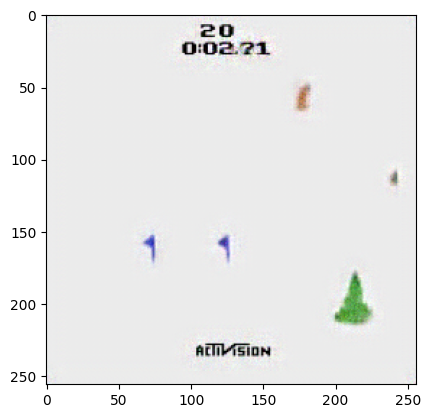

5200 iterations
recon_error: 5205.344
perplexity: 2.424



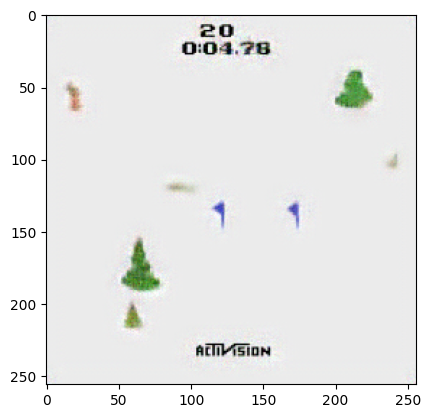

5300 iterations
recon_error: 4969.699
perplexity: 2.451



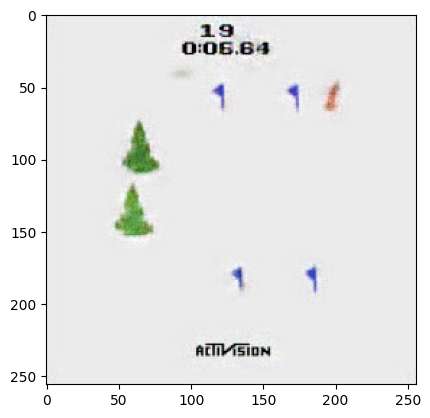

5400 iterations
recon_error: 4779.008
perplexity: 2.455



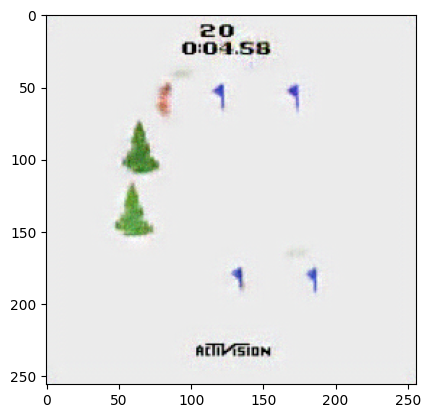

5500 iterations
recon_error: 4620.257
perplexity: 2.457



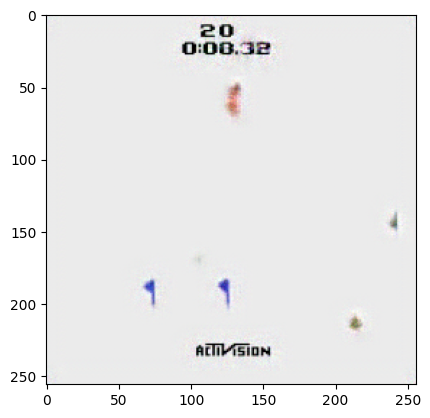

5600 iterations
recon_error: 4415.378
perplexity: 2.455



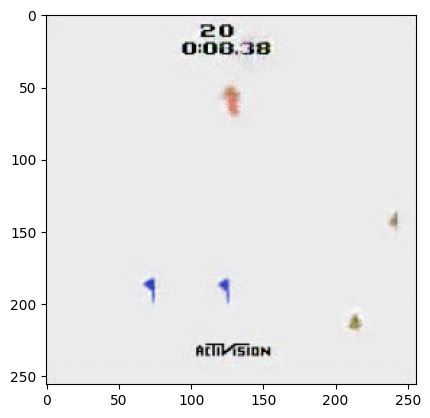

5700 iterations
recon_error: 4302.252
perplexity: 2.458



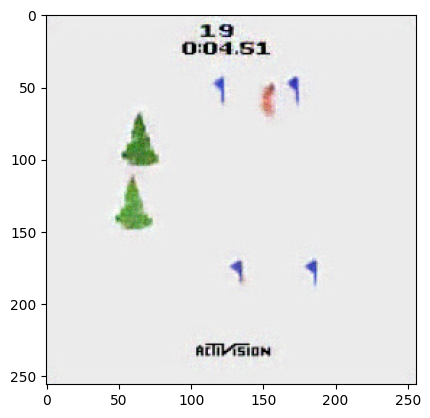

5800 iterations
recon_error: 4189.474
perplexity: 2.459



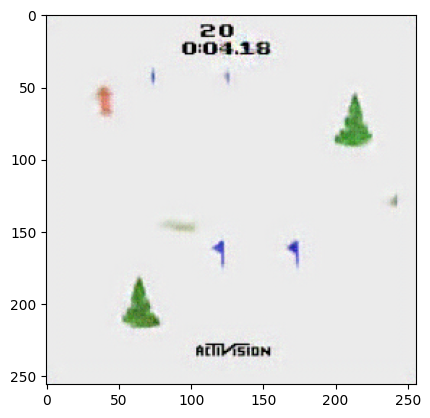

5900 iterations
recon_error: 4072.962
perplexity: 2.464



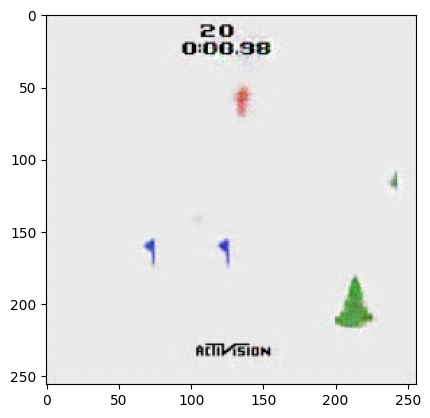

6000 iterations
recon_error: 3908.720
perplexity: 2.467



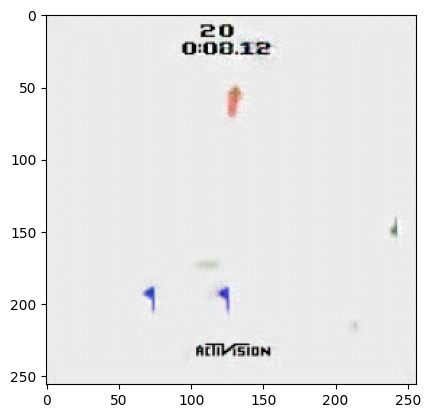

6100 iterations
recon_error: 3963.695
perplexity: 2.476



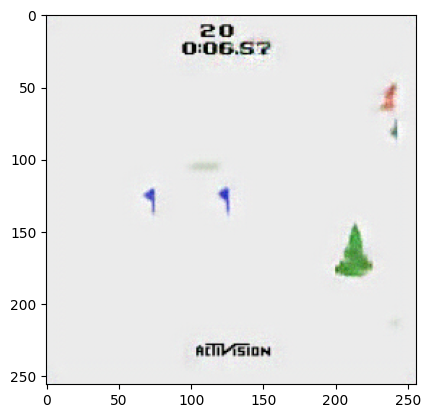

6200 iterations
recon_error: 3930.051
perplexity: 2.501



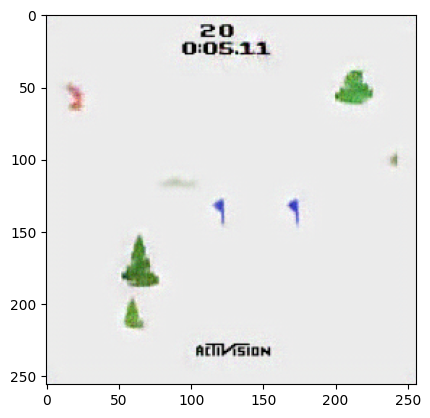

6300 iterations
recon_error: 3743.130
perplexity: 2.511



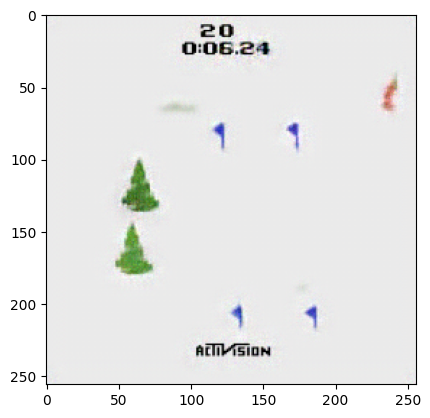

6400 iterations
recon_error: 3671.657
perplexity: 2.516



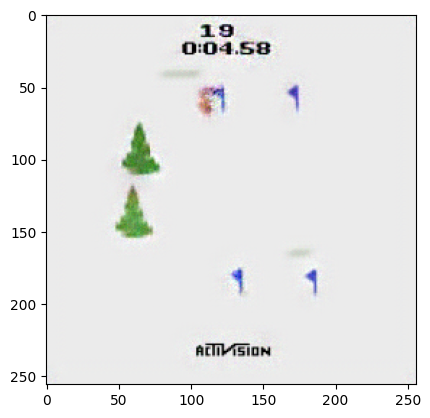

6500 iterations
recon_error: 3544.042
perplexity: 2.529



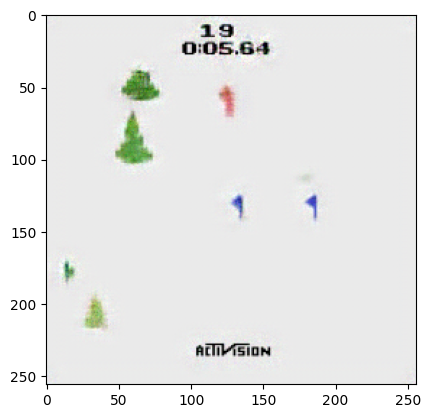

6600 iterations
recon_error: 3432.203
perplexity: 2.539



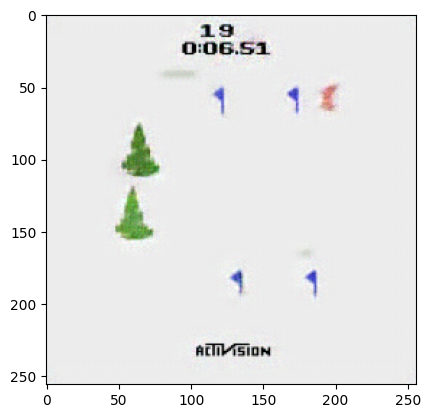

6700 iterations
recon_error: 3388.968
perplexity: 2.550



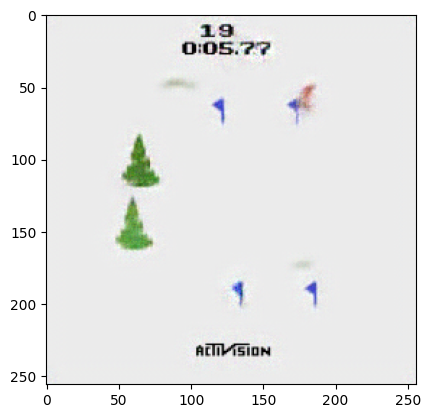

6800 iterations
recon_error: 3308.852
perplexity: 2.548



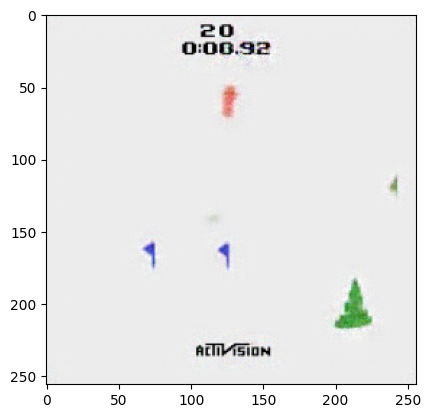

6900 iterations
recon_error: 3231.694
perplexity: 2.551



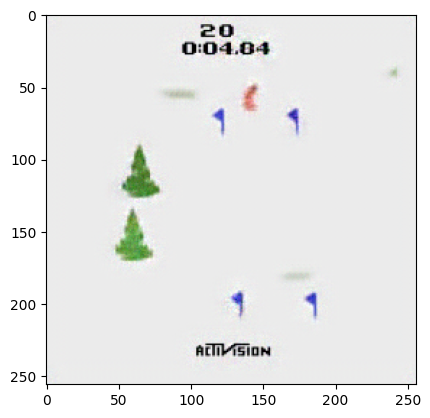

7000 iterations
recon_error: 3170.099
perplexity: 2.559



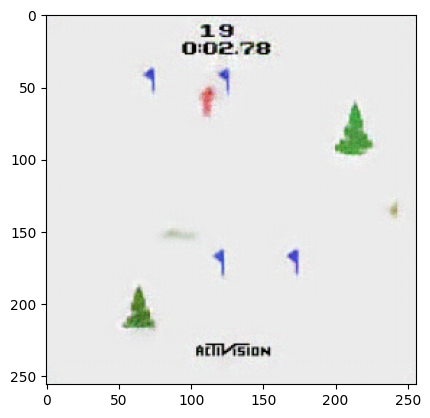

7100 iterations
recon_error: 3128.497
perplexity: 2.558



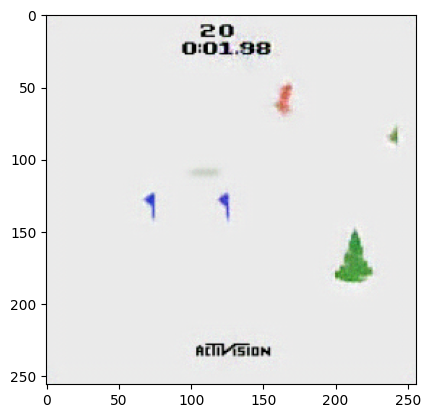

7200 iterations
recon_error: 3083.869
perplexity: 2.553



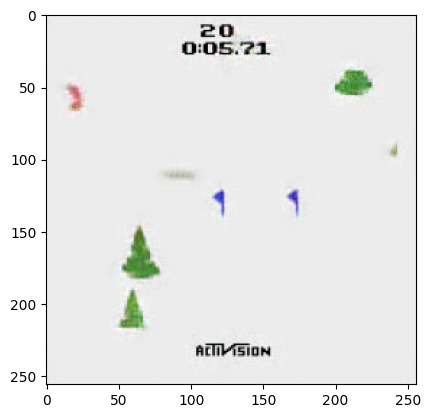

7300 iterations
recon_error: 3025.069
perplexity: 2.555



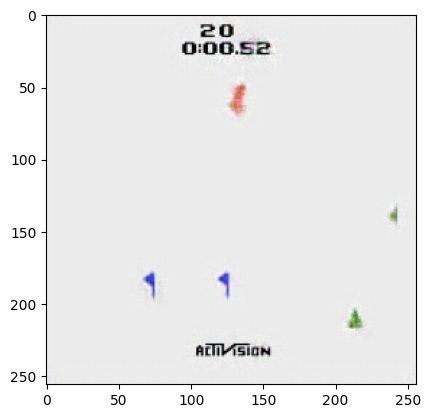

7400 iterations
recon_error: 3011.218
perplexity: 2.554



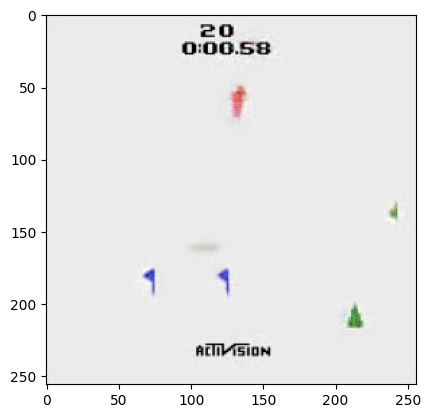

7500 iterations
recon_error: 3151.458
perplexity: 2.569



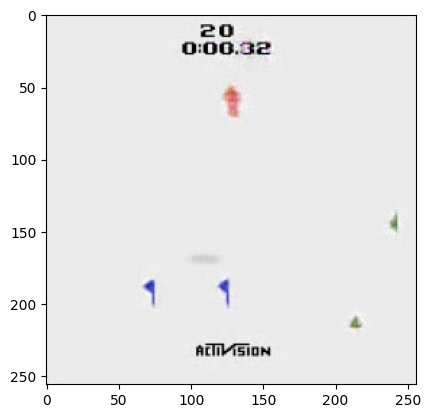

7600 iterations
recon_error: 2848.913
perplexity: 2.572



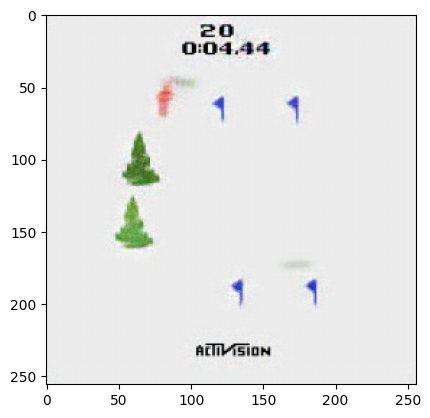

7700 iterations
recon_error: 2779.684
perplexity: 2.572



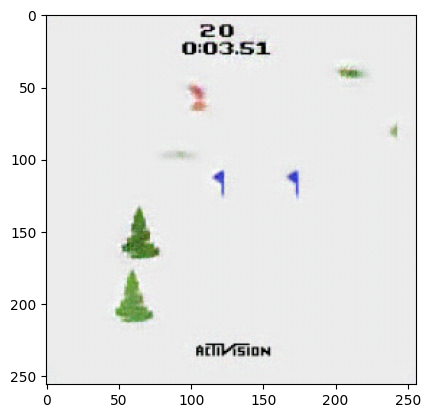

7800 iterations
recon_error: 2733.175
perplexity: 2.561



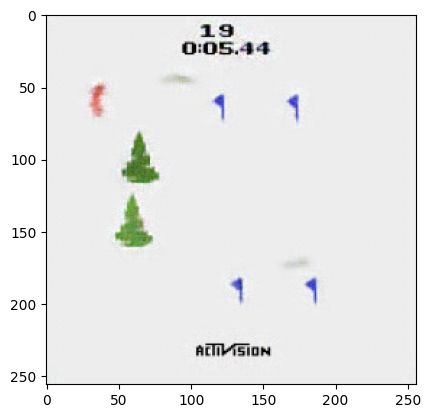

7900 iterations
recon_error: 2624.562
perplexity: 2.562



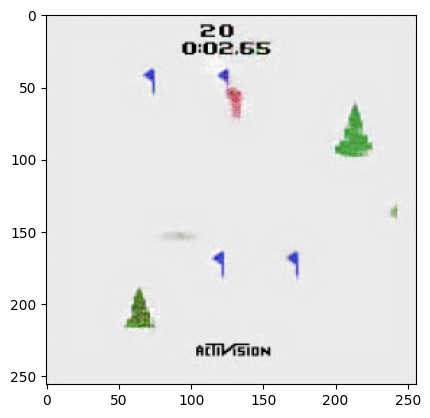

8000 iterations
recon_error: 2589.425
perplexity: 2.566



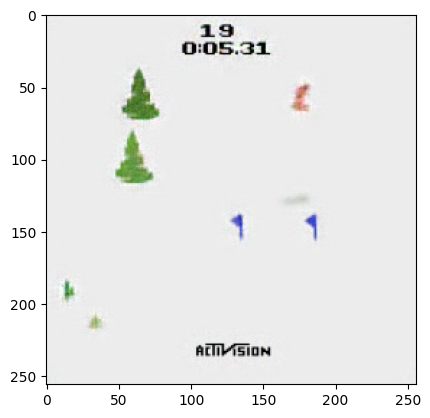

8100 iterations
recon_error: 2540.087
perplexity: 2.569



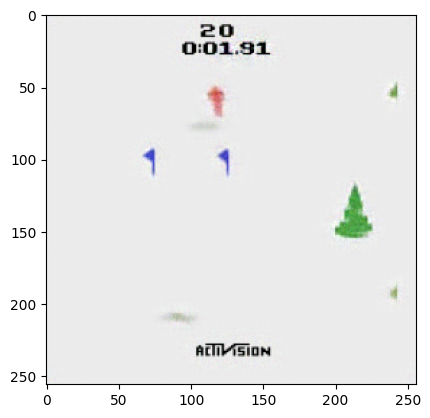

8200 iterations
recon_error: 2463.033
perplexity: 2.562



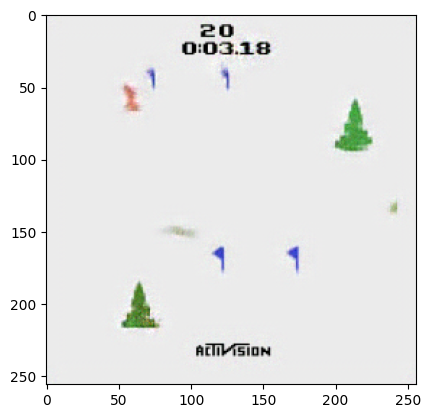

8300 iterations
recon_error: 2458.336
perplexity: 2.561



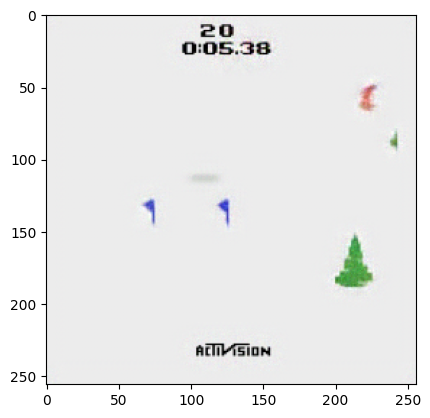

8400 iterations
recon_error: 2404.867
perplexity: 2.560



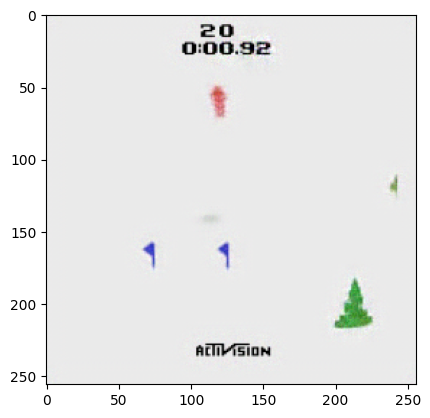

8500 iterations
recon_error: 2379.537
perplexity: 2.563



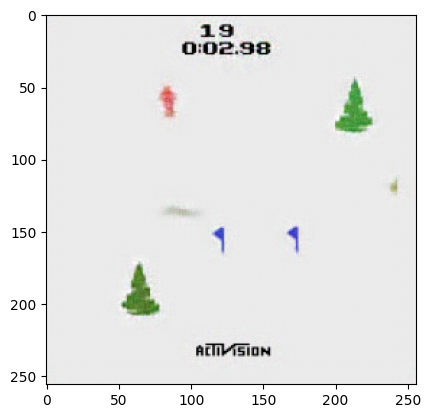

8600 iterations
recon_error: 2269.308
perplexity: 2.562



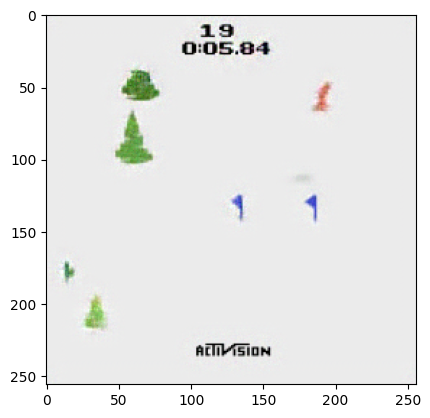

8700 iterations
recon_error: 2314.419
perplexity: 2.558



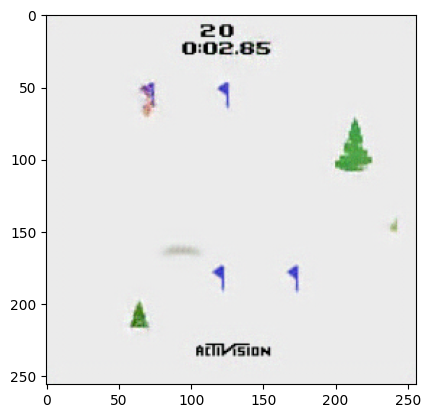

8800 iterations
recon_error: 2245.238
perplexity: 2.563



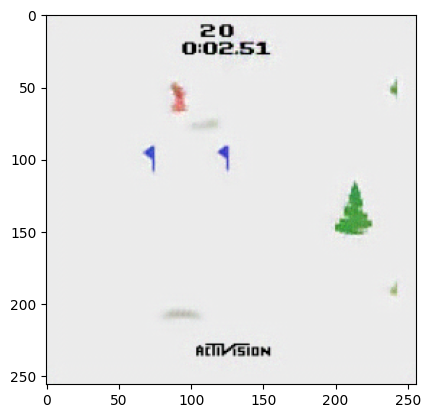

8900 iterations
recon_error: 2190.683
perplexity: 2.559



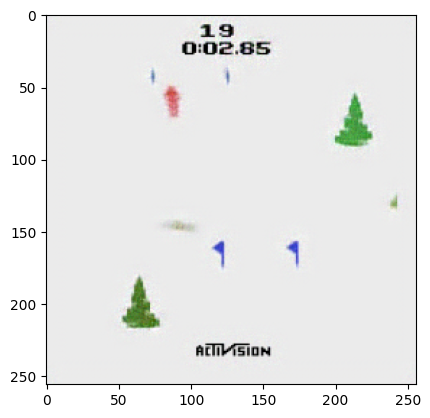

9000 iterations
recon_error: 2167.843
perplexity: 2.559



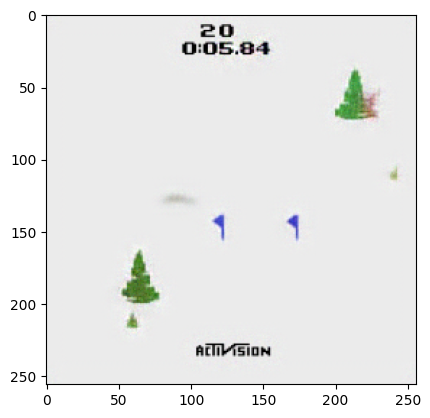

9100 iterations
recon_error: 2193.308
perplexity: 2.561



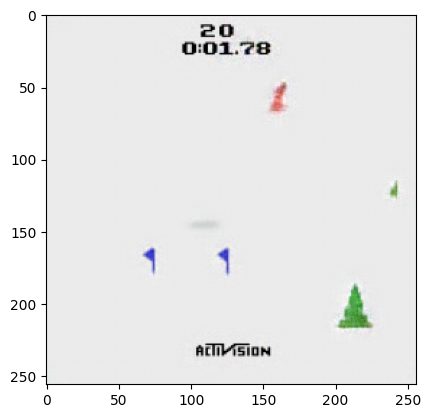

9200 iterations
recon_error: 2119.573
perplexity: 2.562



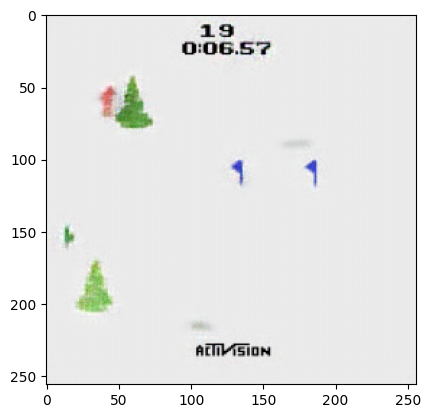

9300 iterations
recon_error: 2125.134
perplexity: 2.561



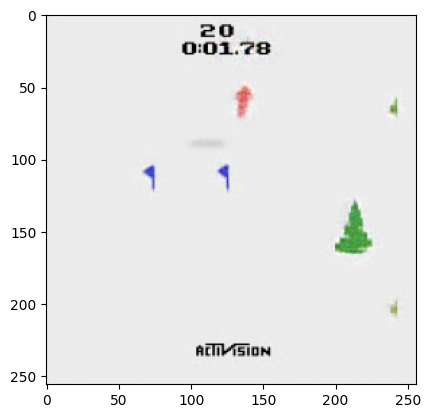

9400 iterations
recon_error: 2049.155
perplexity: 2.557



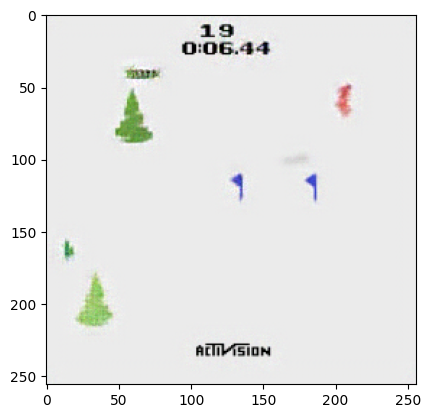

9500 iterations
recon_error: 2112.309
perplexity: 2.572



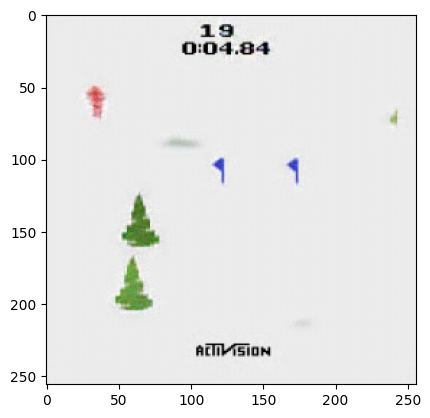

9600 iterations
recon_error: 2008.859
perplexity: 2.581



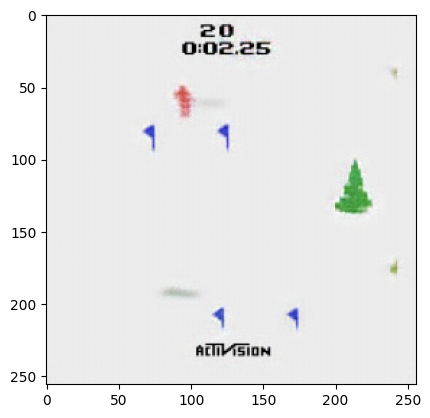

9700 iterations
recon_error: 1994.883
perplexity: 2.590



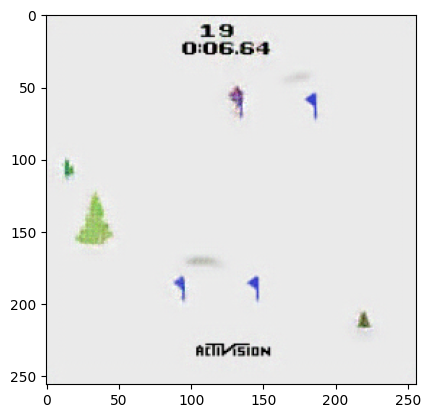

9800 iterations
recon_error: 2007.964
perplexity: 2.593



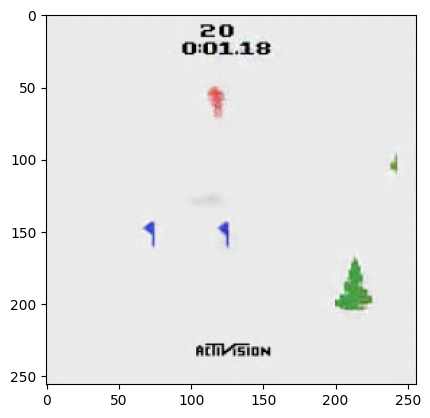

9900 iterations
recon_error: 1938.113
perplexity: 2.600



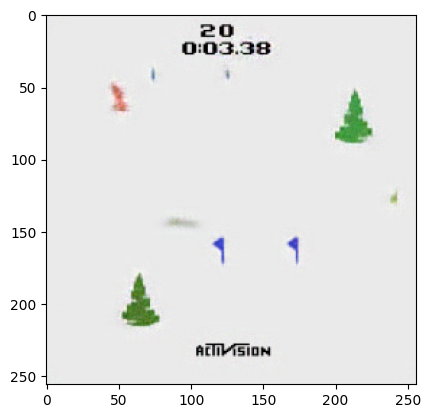

10000 iterations
recon_error: 1985.632
perplexity: 2.613



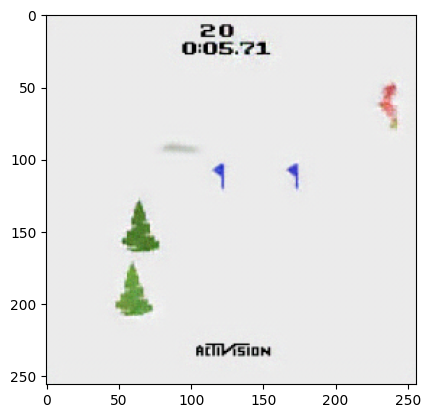

10100 iterations
recon_error: 1907.761
perplexity: 2.618



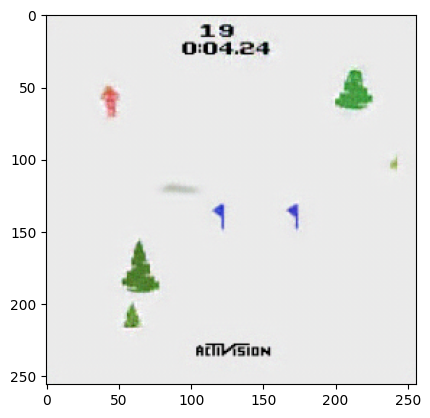

10200 iterations
recon_error: 1942.473
perplexity: 2.633



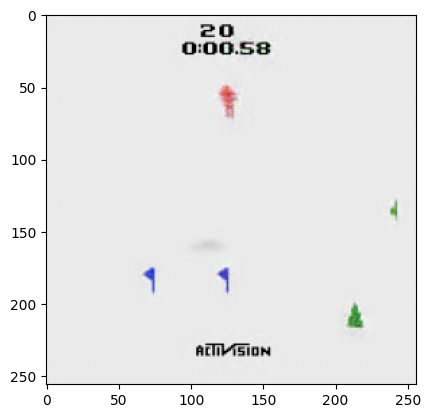

10300 iterations
recon_error: 1897.188
perplexity: 2.627



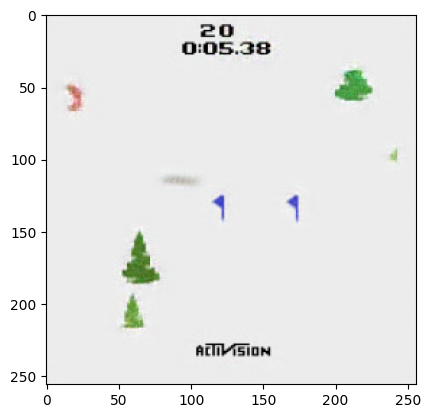

10400 iterations
recon_error: 1863.377
perplexity: 2.628



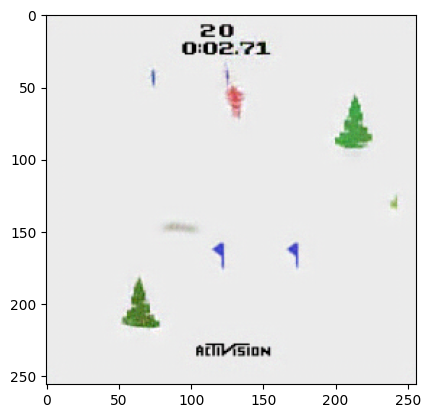

10500 iterations
recon_error: 1849.040
perplexity: 2.641



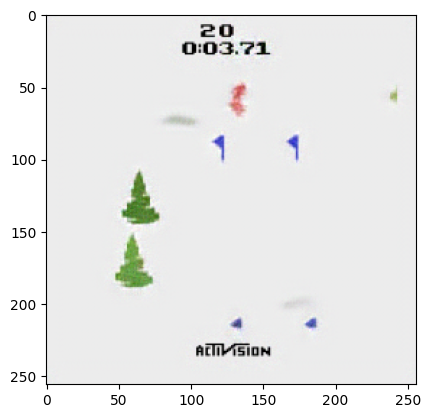

10600 iterations
recon_error: 1823.512
perplexity: 2.652



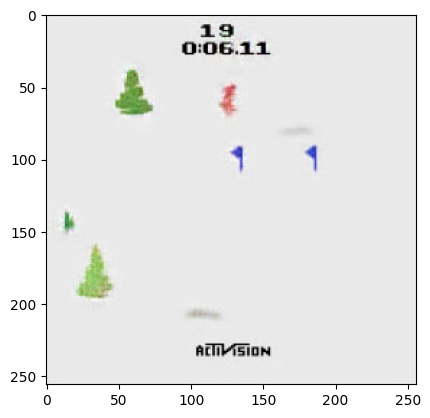

10700 iterations
recon_error: 1765.829
perplexity: 2.649



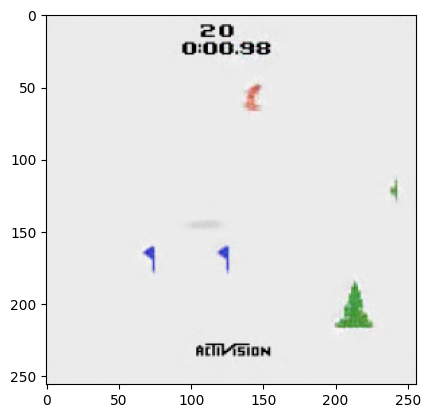

10800 iterations
recon_error: 1835.344
perplexity: 2.660



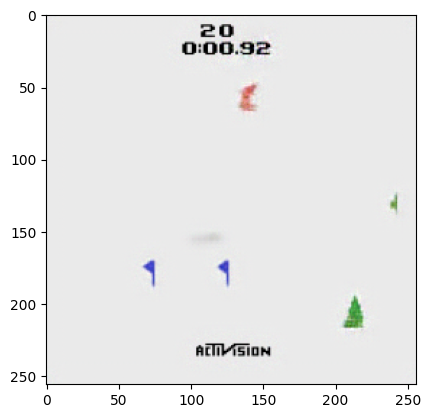

10900 iterations
recon_error: 1742.513
perplexity: 2.668



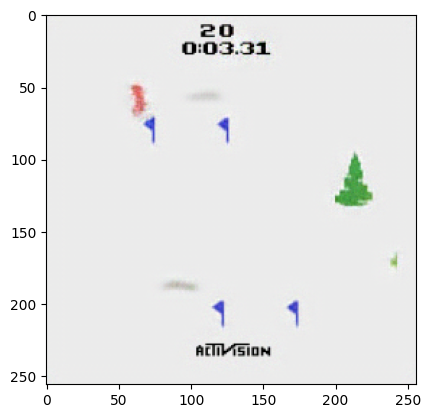

11000 iterations
recon_error: 1771.158
perplexity: 2.664



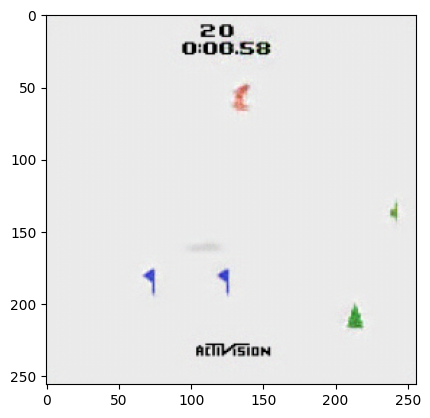

11100 iterations
recon_error: 1682.076
perplexity: 2.677



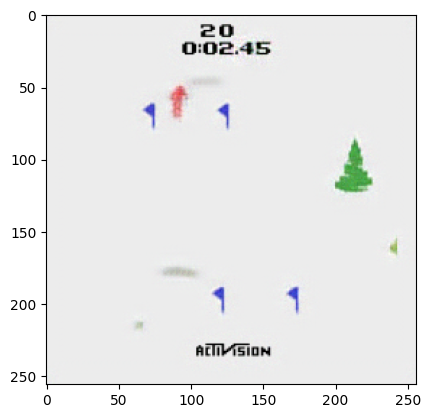

11200 iterations
recon_error: 1696.935
perplexity: 2.683



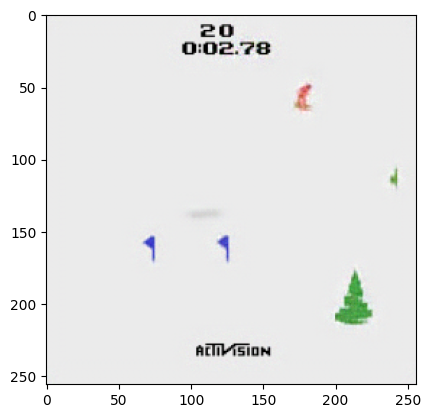

11300 iterations
recon_error: 1706.432
perplexity: 2.680



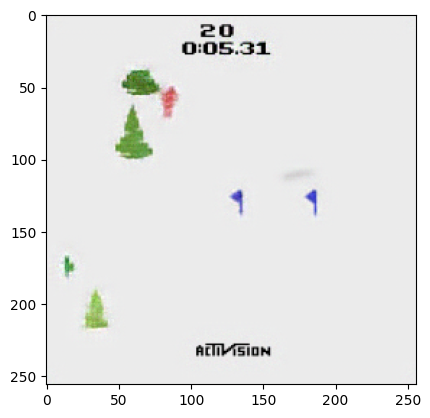

11400 iterations
recon_error: 1664.626
perplexity: 2.677



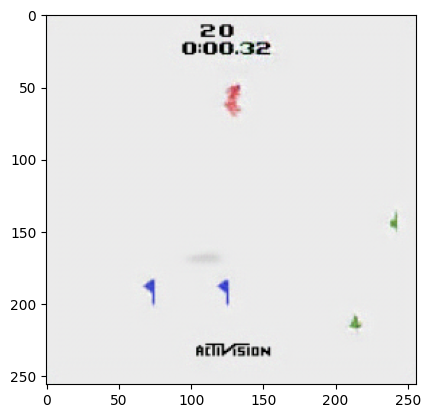

11500 iterations
recon_error: 1664.903
perplexity: 2.684



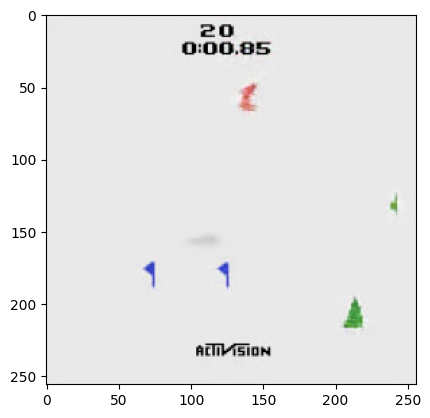

11600 iterations
recon_error: 1633.678
perplexity: 2.689



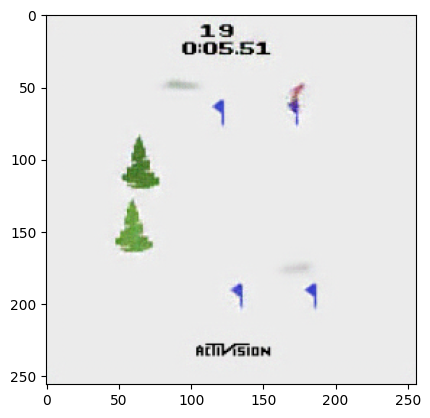

11700 iterations
recon_error: 1645.293
perplexity: 2.690



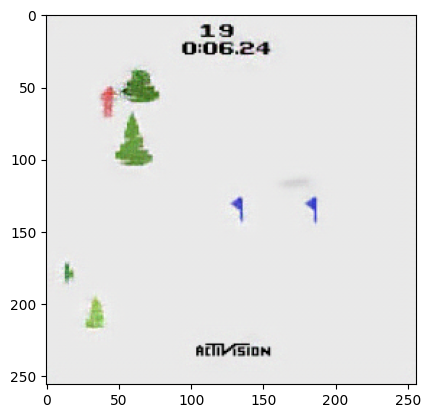

11800 iterations
recon_error: 1694.394
perplexity: 2.695



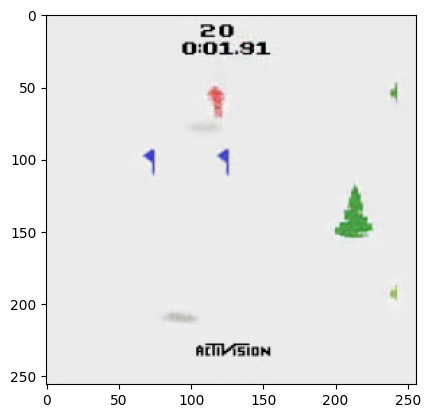

11900 iterations
recon_error: 1593.273
perplexity: 2.692



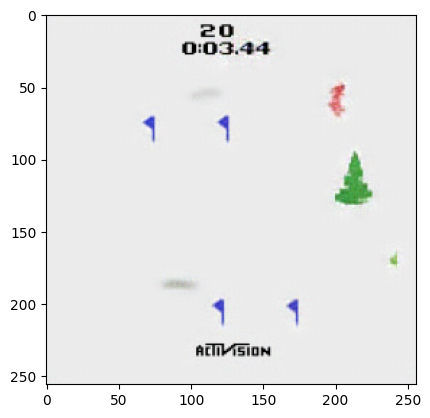

12000 iterations
recon_error: 1593.007
perplexity: 2.707



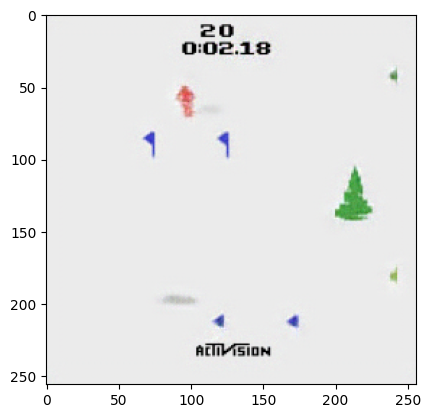

12100 iterations
recon_error: 1615.905
perplexity: 2.708



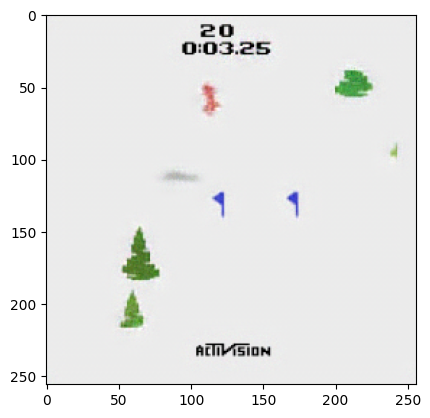

12200 iterations
recon_error: 1558.556
perplexity: 2.717



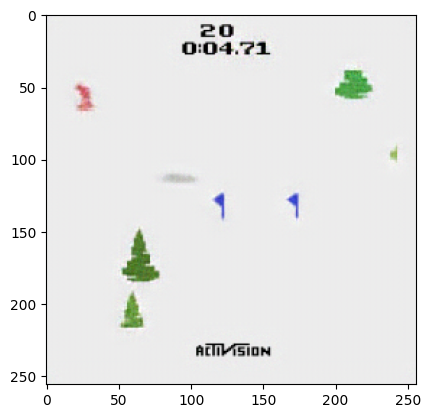

12300 iterations
recon_error: 1553.246
perplexity: 2.729



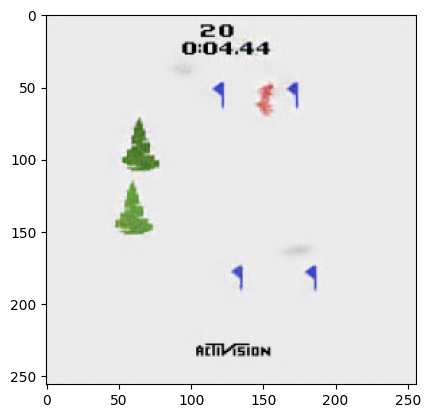

12400 iterations
recon_error: 1529.584
perplexity: 2.731



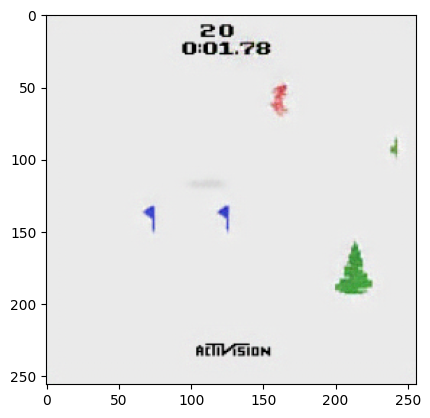

12500 iterations
recon_error: 1555.926
perplexity: 2.745



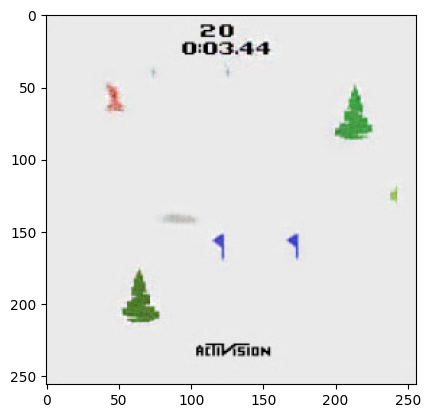

12600 iterations
recon_error: 1555.009
perplexity: 2.749



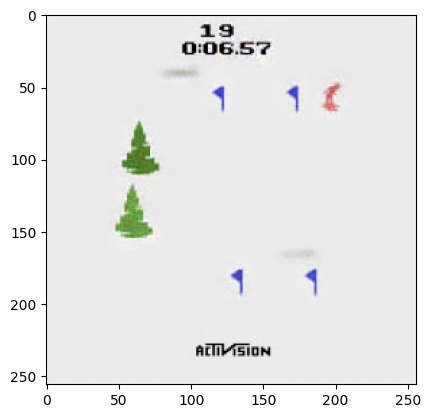

12700 iterations
recon_error: 1481.900
perplexity: 2.755



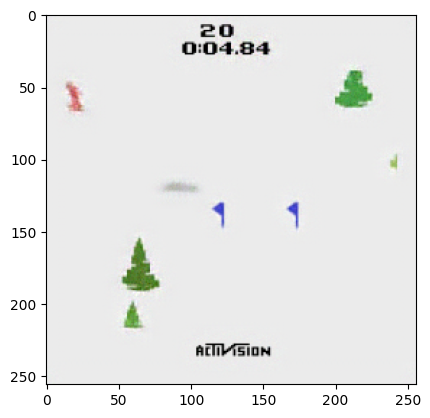

12800 iterations
recon_error: 1481.457
perplexity: 2.754



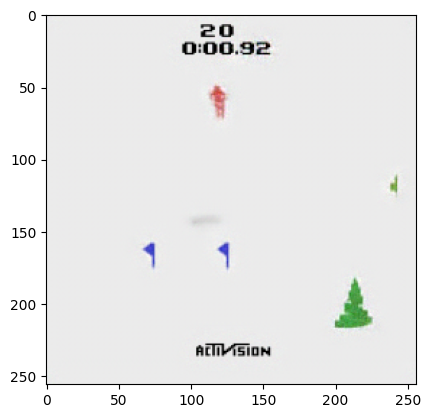

12900 iterations
recon_error: 1523.071
perplexity: 2.759



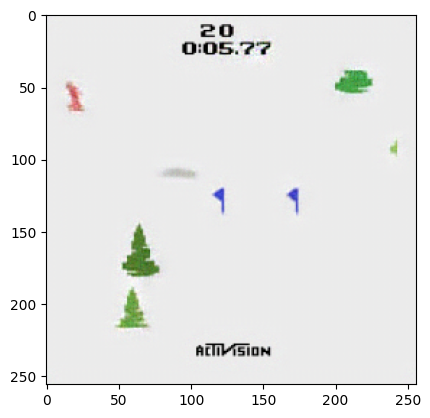

13000 iterations
recon_error: 1435.002
perplexity: 2.773



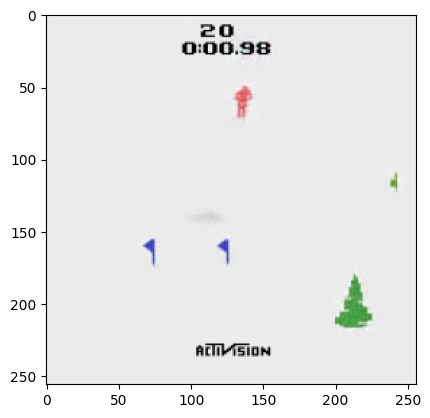

13100 iterations
recon_error: 1436.411
perplexity: 2.768



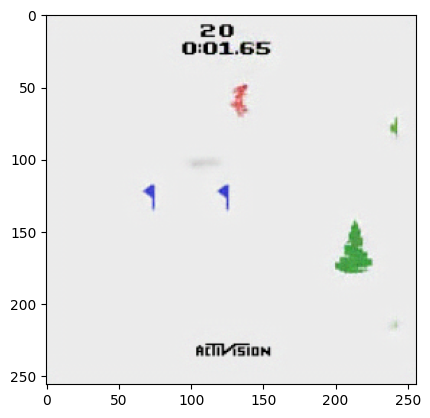

13200 iterations
recon_error: 1418.452
perplexity: 2.772



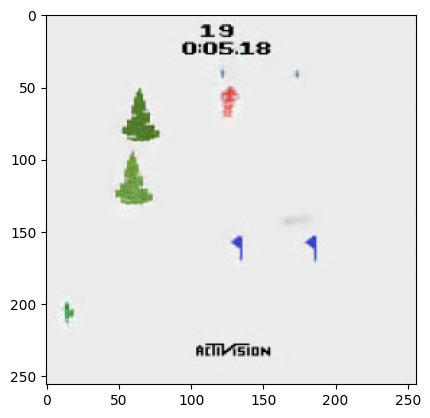

13300 iterations
recon_error: 1433.472
perplexity: 2.776



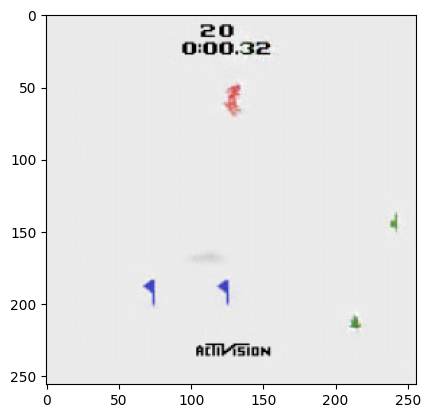

13400 iterations
recon_error: 1398.140
perplexity: 2.779



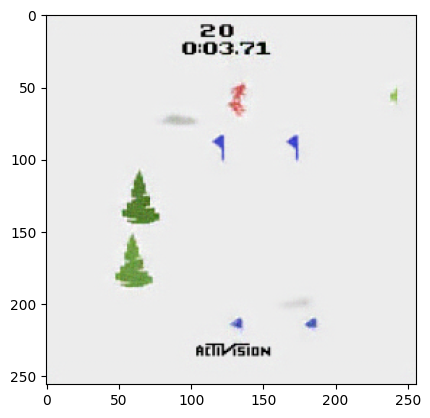

13500 iterations
recon_error: 1389.818
perplexity: 2.782



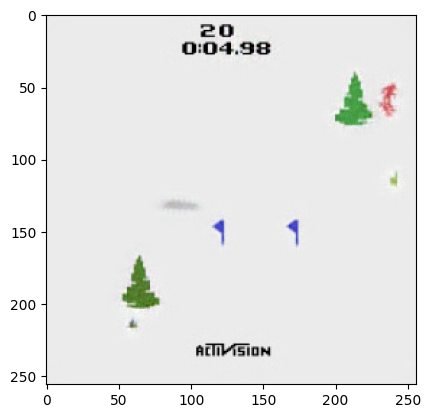

13600 iterations
recon_error: 1369.841
perplexity: 2.790



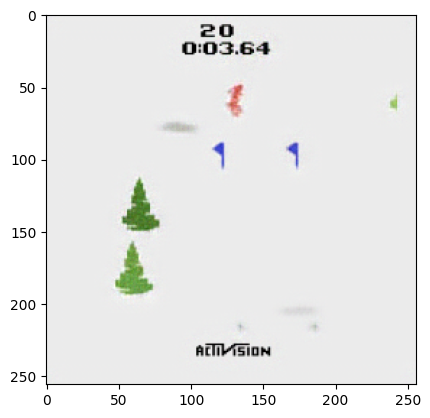

13700 iterations
recon_error: 1379.678
perplexity: 2.789



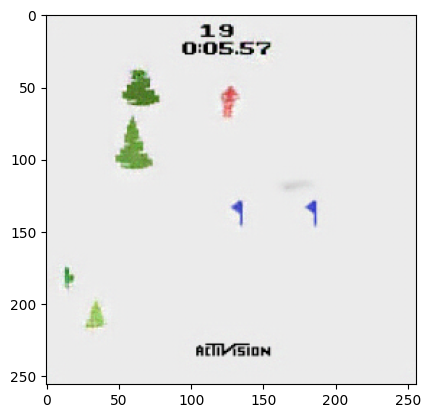

13800 iterations
recon_error: 1362.843
perplexity: 2.797



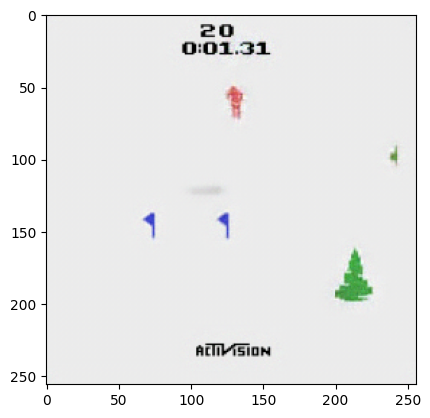

13900 iterations
recon_error: 1422.392
perplexity: 2.796



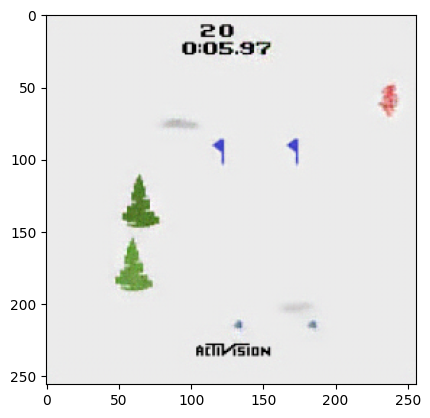

14000 iterations
recon_error: 1283.982
perplexity: 2.801



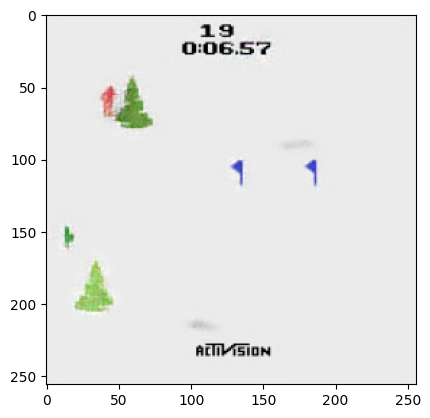

14100 iterations
recon_error: 1321.662
perplexity: 2.807



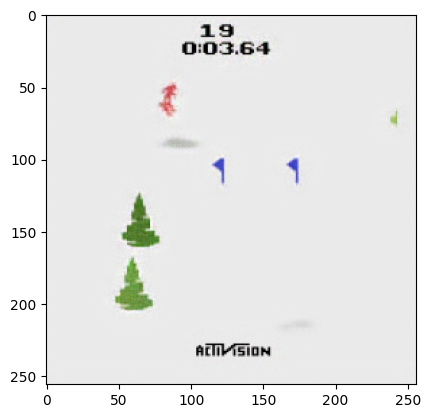

14200 iterations
recon_error: 1322.107
perplexity: 2.812



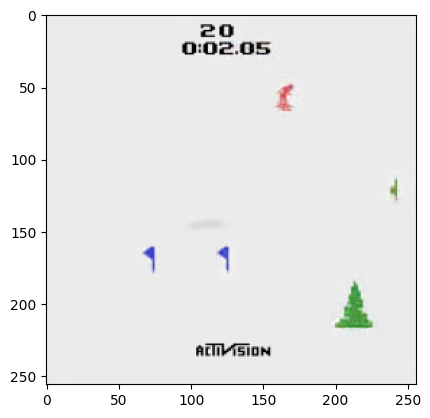

14300 iterations
recon_error: 1276.512
perplexity: 2.809



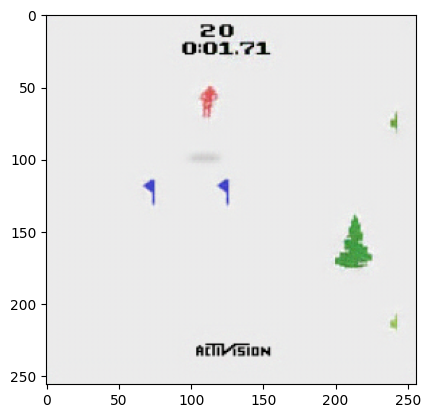

14400 iterations
recon_error: 1293.411
perplexity: 2.810



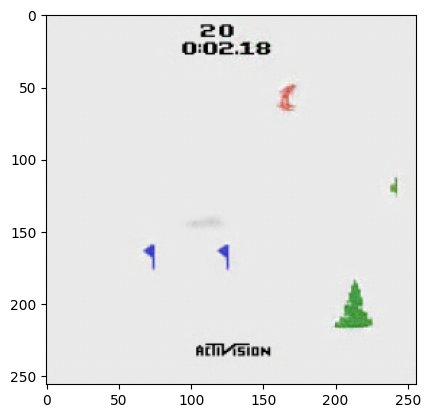

14500 iterations
recon_error: 1255.165
perplexity: 2.809



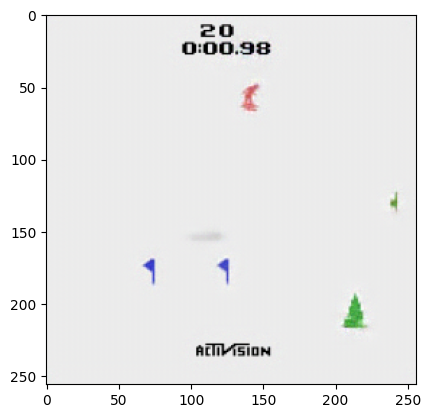

14600 iterations
recon_error: 1274.256
perplexity: 2.815



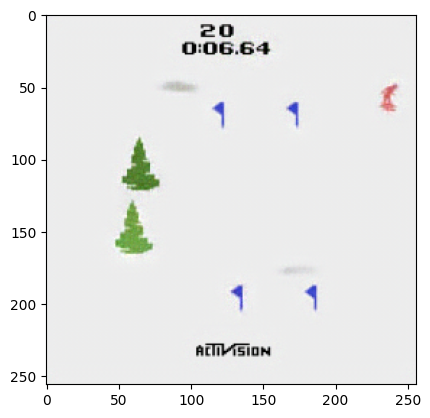

14700 iterations
recon_error: 1251.275
perplexity: 2.812



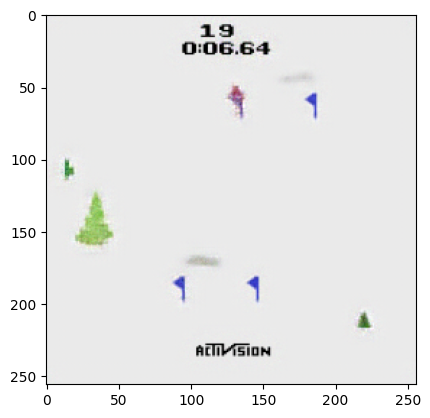

14800 iterations
recon_error: 1263.263
perplexity: 2.822



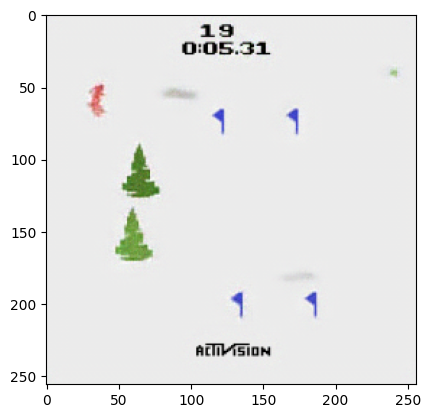

14900 iterations
recon_error: 1276.016
perplexity: 2.823



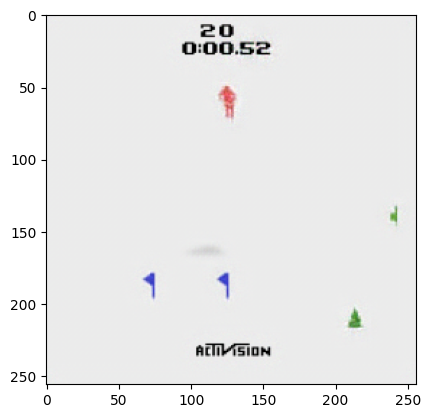

15000 iterations
recon_error: 1196.039
perplexity: 2.824



In [ ]:
model.train()
train_res_recon_error = []
train_res_perplexity = []

for i in xrange(num_training_updates):
    data = next(iter(training_loader))
    data = data.to(device)
    data = data.permute(0, 3, 1, 2).contiguous()
    optimizer.zero_grad()

    vq_loss, data_recon, perplexity = model(data)
    recon_error = F.mse_loss(data_recon, data) / data_variance
    loss = recon_error + vq_loss
    loss.backward()

    optimizer.step()

    train_res_recon_error.append(recon_error.item())
    train_res_perplexity.append(perplexity.item())

    if (i+1) % 100 == 0:
        plt.imshow(data_recon[0].permute(1, 2, 0).detach().cpu().numpy() / 255)
        plt.show()
        print('%d iterations' % (i+1))
        print('recon_error: %.3f' % np.mean(train_res_recon_error[-100:]))
        print('perplexity: %.3f' % np.mean(train_res_perplexity[-100:]))
        print()

## Plot Loss

In [ ]:
train_res_recon_error_smooth = savgol_filter(train_res_recon_error, 201, 7)
train_res_perplexity_smooth = savgol_filter(train_res_perplexity, 201, 7)

Text(0.5, 0, 'iteration')

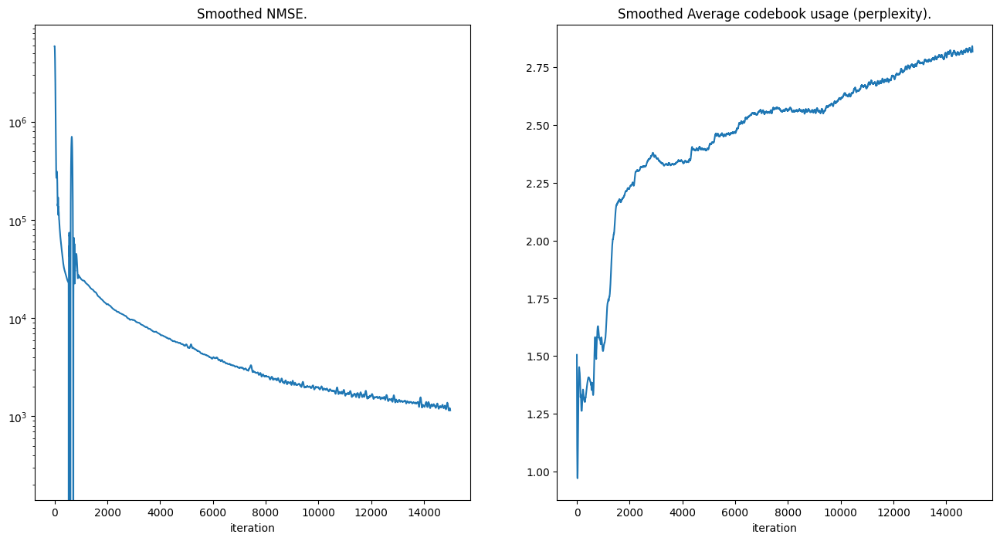

In [ ]:
f = plt.figure(figsize=(16,8))
ax = f.add_subplot(1,2,1)
ax.plot(train_res_recon_error_smooth)
ax.set_yscale('log')
ax.set_title('Smoothed NMSE.')
ax.set_xlabel('iteration')

ax = f.add_subplot(1,2,2)
ax.plot(train_res_perplexity_smooth)
ax.set_title('Smoothed Average codebook usage (perplexity).')
ax.set_xlabel('iteration')

## View Reconstructions

In [ ]:
model.eval()

(valid_originals, _) = next(iter(validation_loader))
valid_originals = valid_originals.to(device)

vq_output_eval = model._pre_vq_conv(model._encoder(valid_originals))
_, valid_quantize, _, _ = model._vq_vae(vq_output_eval)
valid_reconstructions = model._decoder(valid_quantize)

In [ ]:
def show(img):
    npimg = img.numpy()
    fig = plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


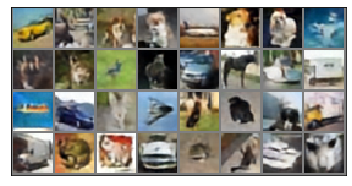

In [ ]:
show(make_grid(valid_reconstructions.cpu().data)+0.5, )

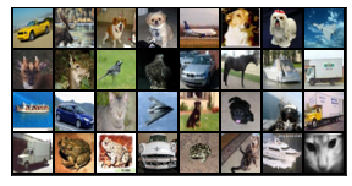

In [ ]:
show(make_grid(valid_originals.cpu()+0.5))

## View Embedding

In [ ]:
proj = umap.UMAP(n_neighbors=3,
                 min_dist=0.1,
                 metric='cosine').fit_transform(model._vq_vae._embedding.weight.data.cpu())

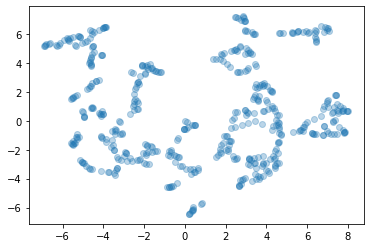

In [ ]:
plt.scatter(proj[:,0], proj[:,1], alpha=0.3)